# Loading, Inspecting, and Preprocessing the Data

In [112]:
# load packages 
suppressPackageStartupMessages(library(tidyverse))
options(warn=-1)
library(repr)
options(repr.plot.width=15, repr.plot.height=10)
library(broom)
library(ggplot2)
library(ggthemes)
library(GGally)
library(ggalt)
library(cowplot)
library(viridis)
library(maps)
library(sf)
library(ggspatial)
library(rgdal)
library(tmap)
library(car)
library(rpart)
library(caret)
library(car)
library(nlme)

select <- dplyr::select

# path in which data is located
DATA_PATH = "Stat/"

In [113]:
# put data for all stations in a singe dataset, 
# where the data for each station is a file named "station_X", X=station number
file.names <- list.files(DATA_PATH, pattern = "station_")

file.paths <- paste0(DATA_PATH, file.names)

n.files <- length(file.names)

data.list <- lapply(file.paths, function(f.name){
  read.csv(f.name, header = FALSE)
})

names(data.list) <- file.names

df <- do.call(rbind.data.frame, data.list)
colnames(df) <- c("Year","Streamflow", "T_min", "T_max", "Snowmelt", "Precipitation")
df$Station <- sapply(strsplit(rownames(df), split = "[.]"), function(name){return(name[1])})
rownames(df) <- NULL

# save the single dataset
save.data.path <- "Stat/Watershed_Data_Aggregated_245_Stations.csv"
write.csv(df, file=save.data.path)

In [114]:
# load the data
raw.data <- read.csv("Stat/Watershed_Data_Aggregated_245_Stations.csv", row.names=1)

In [115]:
summary(raw.data)

      Year        Streamflow         T_min             T_max        
 Min.   :1909   Min.   : 0.000   Min.   :-20.347   Min.   :-13.966  
 1st Qu.:1974   1st Qu.: 0.634   1st Qu.: -4.140   1st Qu.:  7.237  
 Median :1987   Median : 1.224   Median : -1.411   Median :  9.645  
 Mean   :1985   Mean   : 1.690   Mean   : -1.533   Mean   :  9.152  
 3rd Qu.:2000   3rd Qu.: 2.127   3rd Qu.:  1.421   3rd Qu.: 11.798  
 Max.   :2019   Max.   :28.170   Max.   :  9.245   Max.   : 17.590  
                NA's   :20047    NA's   :29684     NA's   :29663    
    Snowmelt      Precipitation            Station     
 Min.   :-0.101   Min.   : 0.000   station_1032:  108  
 1st Qu.: 0.296   1st Qu.: 1.260   station_1013:  107  
 Median : 0.437   Median : 1.939   station_1022:  107  
 Mean   : 0.514   Mean   : 2.219   station_1033:  107  
 3rd Qu.: 0.647   3rd Qu.: 2.849   station_1000:  106  
 Max.   : 4.419   Max.   :14.801   station_1002:  106  
 NA's   :27753    NA's   :27522    (Other)     :62586  

In [116]:
# replace 0s with really small number for precipitation
raw.data <- raw.data %>% mutate(Precipitation=replace(Precipitation, 
                                Precipitation==0, 0.001)) 

In [117]:
# calculate average temperature and Snow-Precipitation-Ratio
raw.data <- raw.data %>% mutate(Snow_Precip_Ratio=Snowmelt/Precipitation)

In [118]:
tail(raw.data)

,Year,Streamflow,T_min,T_max,Snowmelt,Precipitation,Station,Snow_Precip_Ratio
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
63222,1926,0.79984,0.30603,11.4700,0.48274,1.4825,station_999,0.3256256
63223,1927,2.44630,-1.10490,10.4690,0.48822,1.5468,station_999,0.3156323
63224,1928,2.02520,-1.89700,8.1981,0.57760,2.3418,station_999,0.2466479
63225,1929,1.28300,-1.75180,9.6140,0.44301,1.4901,station_999,0.2973022
63226,1930,1.20320,-1.95160,9.6907,0.81433,1.3519,station_999,0.6023596
63227,1931,NA,NA,NA,NA,NA,station_999,NA


In [119]:
dim(raw.data)

[1] 63227     8

In [120]:
summary(raw.data)

      Year        Streamflow         T_min             T_max        
 Min.   :1909   Min.   : 0.000   Min.   :-20.347   Min.   :-13.966  
 1st Qu.:1974   1st Qu.: 0.634   1st Qu.: -4.140   1st Qu.:  7.237  
 Median :1987   Median : 1.224   Median : -1.411   Median :  9.645  
 Mean   :1985   Mean   : 1.690   Mean   : -1.533   Mean   :  9.152  
 3rd Qu.:2000   3rd Qu.: 2.127   3rd Qu.:  1.421   3rd Qu.: 11.798  
 Max.   :2019   Max.   :28.170   Max.   :  9.245   Max.   : 17.590  
                NA's   :20047    NA's   :29684     NA's   :29663    
    Snowmelt      Precipitation            Station      Snow_Precip_Ratio
 Min.   :-0.101   Min.   : 0.001   station_1032:  108   Min.   :-0.101   
 1st Qu.: 0.296   1st Qu.: 1.260   station_1013:  107   1st Qu.: 0.176   
 Median : 0.437   Median : 1.939   station_1022:  107   Median : 0.253   
 Mean   : 0.514   Mean   : 2.219   station_1033:  107   Mean   : 0.263   
 3rd Qu.: 0.647   3rd Qu.: 2.849   station_1000:  106   3rd Qu.: 0.340   
 Max

In [121]:
# determine if there's atleast one missing column in each row
raw.data <- raw.data %>% mutate(is.incomplete=is.na(Streamflow) | is.na(T_min) | 
                                               is.na(T_max) | is.na(Snowmelt) | 
                                               is.na(Precipitation) |
                                               is.na(Snow_Precip_Ratio))

head(raw.data[raw.data$is.incomplete,])

,Year,Streamflow,T_min,T_max,Snowmelt,Precipitation,Station,Snow_Precip_Ratio,is.incomplete
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<lgl>
1,1964,0.174700,NA,NA,NA,NA,station_1,NA,TRUE
2,1965,0.255540,NA,NA,NA,NA,station_1,NA,TRUE
3,1966,0.273170,NA,NA,NA,NA,station_1,NA,TRUE
30,1993,0.070897,NA,NA,NA,NA,station_1,NA,TRUE
50,1957,NA,NA,NA,NA,NA,station_10,NA,TRUE
51,1958,0.421080,NA,NA,NA,NA,station_10,NA,TRUE


In [122]:
head(raw.data[!raw.data$is.incomplete,])

,Year,Streamflow,T_min,T_max,Snowmelt,Precipitation,Station,Snow_Precip_Ratio,is.incomplete
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<lgl>
4,1967,0.20268,-8.6189,4.1438,0.31945,1.0342,station_1,0.3088861,FALSE
5,1968,0.12508,-5.8295,5.2814,0.33415,1.1577,station_1,0.2886326,FALSE
6,1969,0.13149,-7.3348,4.3597,0.35205,1.3537,station_1,0.2600650,FALSE
7,1970,0.21404,-6.1414,5.2655,0.30685,1.9455,station_1,0.1577230,FALSE
8,1971,0.30059,-6.4904,4.5359,0.27096,1.5745,station_1,0.1720927,FALSE
9,1972,0.22532,-7.7372,3.5954,0.53224,1.5344,station_1,0.3468717,FALSE


# Exploratory Data Analysis

In [123]:
# group the data by station
by.station <- raw.data %>% group_by(Station)

In [124]:
# count the number of total, missing, and complete observations (rows) per station
station.counts <- by.station %>% summarise(num.observations=n(),
                                              num.missing=sum(is.incomplete),
                                              num.complete=num.observations-num.missing,
                                              pct.missing=100*num.missing/num.observations) 
head(station.counts)

Station,num.observations,num.missing,num.complete,pct.missing
<fct>,<int>,<int>,<int>,<dbl>
station_1,49,4,45,8.163265
station_10,37,12,25,32.432432
station_100,44,44,0,100.000000
station_1000,106,106,0,100.000000
station_1002,106,106,0,100.000000
station_1003,73,25,48,34.246575


In [125]:
summary(station.counts)

         Station     num.observations  num.missing      num.complete  
 station_1   :   1   Min.   : 19.00   Min.   :  0.00   Min.   : 0.00  
 station_10  :   1   1st Qu.: 33.00   1st Qu.:  7.00   1st Qu.: 0.00  
 station_100 :   1   Median : 42.00   Median : 21.00   Median :19.00  
 station_1000:   1   Mean   : 44.37   Mean   : 24.69   Mean   :19.68  
 station_1002:   1   3rd Qu.: 52.00   3rd Qu.: 38.00   3rd Qu.:33.00  
 station_1003:   1   Max.   :108.00   Max.   :106.00   Max.   :99.00  
 (Other)     :1419                                                    
  pct.missing    
 Min.   :  0.00  
 1st Qu.: 18.45  
 Median : 47.54  
 Mean   : 54.33  
 3rd Qu.:100.00  
 Max.   :100.00  
                 

In [126]:
# transform to long format for plotting
station.counts.long <- gather(station.counts %>% select(num.missing, num.complete) %>%
                              rename(Missing=num.missing, Complete=num.complete), "Type", "Value", 1:2)

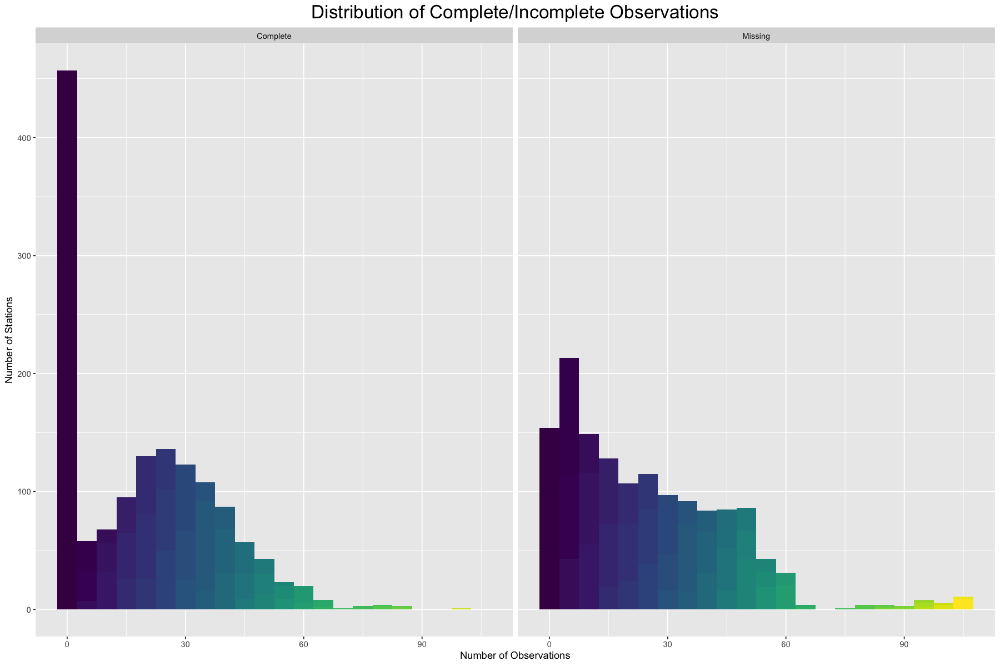

In [127]:
# plot the distributions of complete and incomplete observations
plot_missing_histograms <- function(data) {
    histograms <- ggplot(data, aes(Value, fill = cut(Value, 50))) + 
                geom_histogram(show.legend=FALSE, binwidth=5) + 
                xlab("Number of Observations") + 
                ylab("Number of Stations") +
                labs(title="Distribution of Complete/Incomplete Observations") +
                theme(plot.title=element_text(hjust = 0.5, size=20)) + 
                scale_fill_viridis_d() + facet_wrap(~ Type, nrow=1) 
    histograms
}

plot_missing_histograms(station.counts.long)

In [128]:
# select stations with more than 10 complete observations
stations.morethan10obs <- station.counts %>% filter(num.complete >= 10) %>% select(Station)
data.morethan10obs <- raw.data %>% filter(Station %in% stations.morethan10obs$Station) %>% filter(complete.cases(.))
summary(data.morethan10obs)

      Year        Streamflow          T_min              T_max        
 Min.   :1911   Min.   : 0.0000   Min.   :-20.3470   Min.   :-13.966  
 1st Qu.:1976   1st Qu.: 0.7642   1st Qu.: -3.5857   1st Qu.:  7.476  
 Median :1987   Median : 1.3575   Median : -0.6792   Median : 10.115  
 Mean   :1986   Mean   : 1.8078   Mean   : -1.0682   Mean   :  9.416  
 3rd Qu.:1998   3rd Qu.: 2.2715   3rd Qu.:  1.8560   3rd Qu.: 12.114  
 Max.   :2018   Max.   :19.7710   Max.   :  9.2450   Max.   : 17.590  
                                                                      
    Snowmelt      Precipitation            Station      Snow_Precip_Ratio
 Min.   :0.0000   Min.   : 0.001   station_1022:   99   Min.   :0.0000   
 1st Qu.:0.3158   1st Qu.: 1.338   station_730 :   85   1st Qu.:0.1744   
 Median :0.4699   Median : 2.209   station_1438:   84   Median :0.2532   
 Mean   :0.5435   Mean   : 2.346   station_887 :   84   Mean   :0.2628   
 3rd Qu.:0.6857   3rd Qu.: 2.977   station_1406:   82   3rd Qu

In [129]:
# count the number of stations with more than 10 complete observations
num.stations <- length(unique(data.morethan10obs$Station))
num.stations

[1] 886

In [130]:
# set seed for reprodicibility
set.seed(450)

# select a random subset of the stations where the number of complete observations >= threshold
select_n_random_stations <- function(orig.data, count.data, n, threshold){
    random.stations <- sample_n(count.data[count.data$num.complete >= threshold,], n)$Station
    stations.subset <- orig.data %>% filter(Station %in% random.stations)
    stations.subset
}

In [131]:
# select a subset of 100 random stations with atleast 10 complete obsevations
station.subset.60 <- select_n_random_stations(data.morethan10obs, station.counts, 60, 10)

In [132]:
# visualize the stations with overlapping years
plot_overlapping_years <- function(data){
    data <- data %>% mutate(Station_number=gsub('.*_([0-9]+).*','\\1', Station))
    ggplot(data[complete.cases(data),], aes(x=Station_number, y=Year, colour=Year)) +
            geom_jitter(show.legend=FALSE) + scale_colour_viridis_c(direction=-1) +
            xlab("Station") + 
            ylab("Year") +
            labs(title="Stations With Observations for Overlapping years") +
            theme(plot.title=element_text(hjust = 0.5, size=20),
                 axis.text.x=element_text(angle=90, hjust=1)) 
}

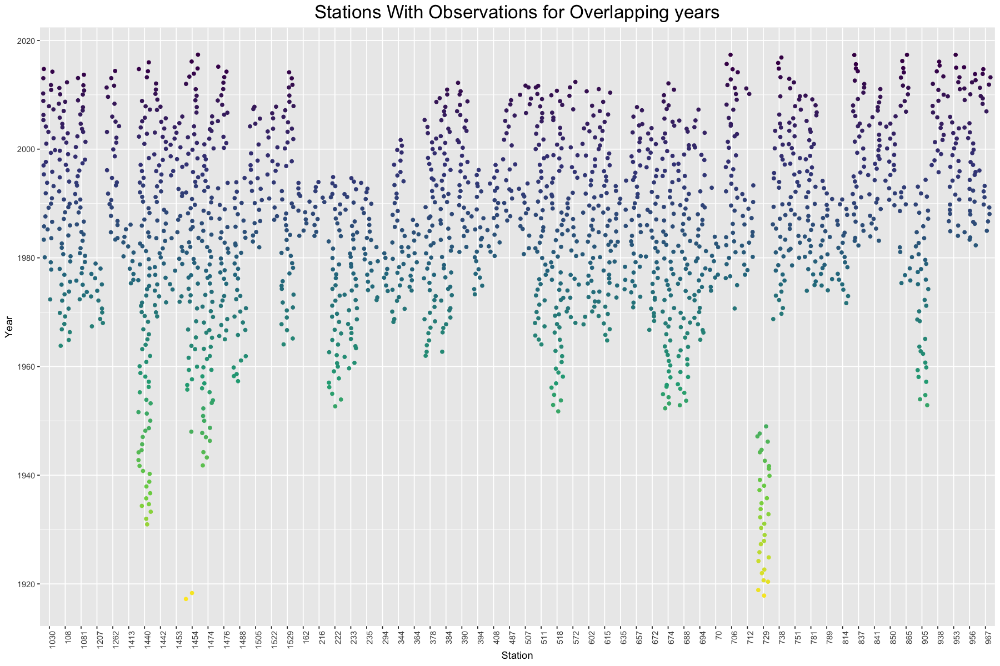

In [133]:
# plot stations (random sample of 60) with observations with common years
plot_overlapping_years(station.subset.60)

In [134]:
# plot pairwise corralation matrix for a subset of random selected stations
plot_variable_correlations <- function(data, n.rows){
    vars.keep <- names(data %>% select(Year, Streamflow, T_min, T_max, Snowmelt, 
                                       Precipitation, Snow_Precip_Ratio))
    data$Station <- as.character(data$Station)
    correlation.matrices <- data %>% split(.$Station) %>% 
                            purrr::map(select, vars.keep) %>% 
                            purrr::map(cor, use = "pairwise.complete.obs") %>%
                            purrr::map(round,2)
    df <- correlation.matrices %>% reshape2::melt() %>% rename(Station=L1)
    heatmaps <- ggplot(df, aes(x=Var1, y=Var2, fill=value)) + geom_tile() + 
                facet_wrap(~Station, nrow=n.rows) +
                geom_text(aes(label=value), color="white") +
                scale_fill_viridis_c(direction=-1) +
                labs(title="Pairwise Corralations Between Variables", fill="Correlation") +
                theme(plot.title=element_text(hjust = 0.5, size=20),
                      axis.title.x=element_blank(), axis.title.y=element_blank(),
                      axis.text.x=element_text(angle=45, hjust=1))
    heatmaps
}

In [135]:
# select a subset of 9 random stations with atleast 10 complete obsevations
station.subset.9 <- select_n_random_stations(data.morethan10obs, station.counts, 9, 10)

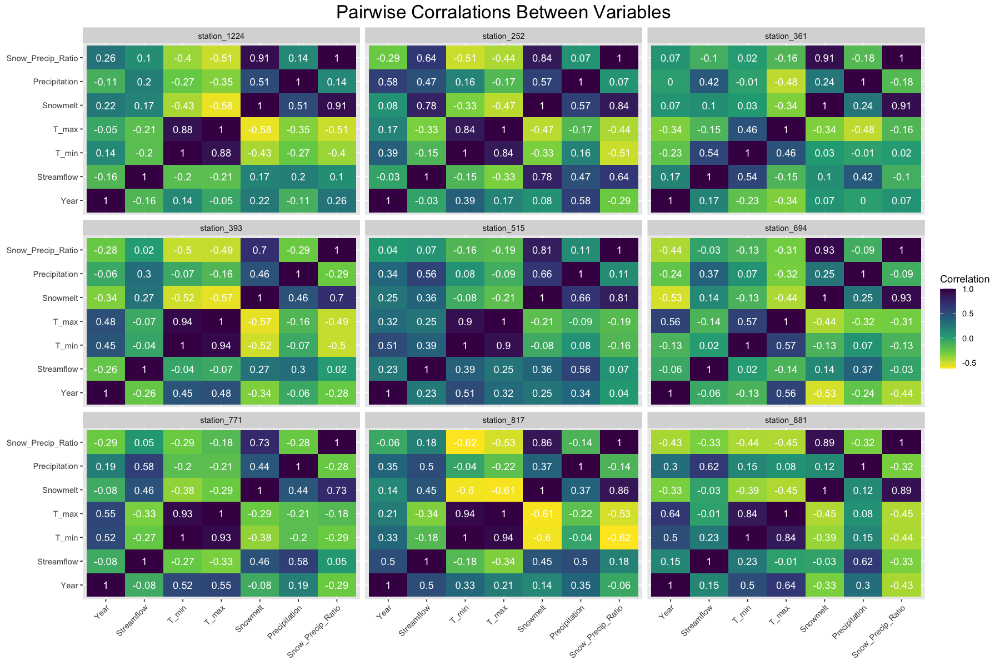

In [136]:
plot_variable_correlations(station.subset.9, 3)

In [137]:
# plot the variability between stations
plot_station_variability <- function(data, variable, name){
    data <- data %>% mutate(Station_number=gsub('.*_([0-9]+).*','\\1', Station))
    boxplots <-  ggplot(data[complete.cases(data),], 
                    aes_string(x="Station_number", y=variable, fill="Station")) + 
                    geom_boxplot(show.legend=FALSE) + scale_fill_viridis_d(direction=-1) +
                    labs(title="Variability Between Stations", fill="Station", x="Station") + 
                    ylab(name) +
                    theme(plot.title=element_text(hjust=0.5, size=20),
                    axis.text.x=element_text(angle=90, hjust=1))
    boxplots
}

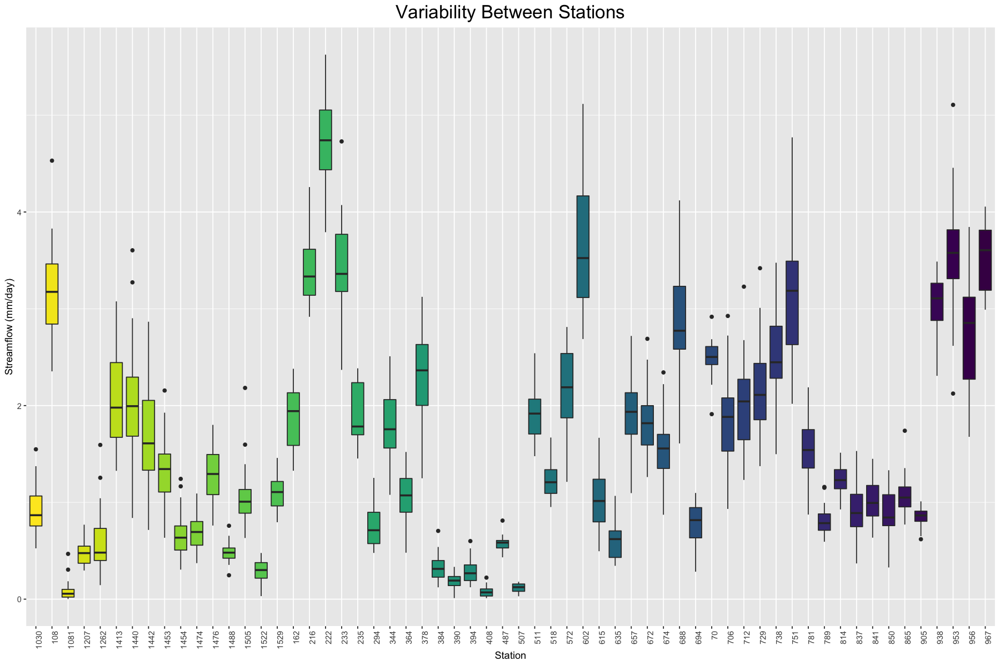

In [138]:
# plot streamflow variability bween stations
plot_station_variability(station.subset.60, "Streamflow", "Streamflow (mm/day)")

In [139]:
# plot the variability between years
plot_year_variability <- function(data, variable, name){
    boxplots <-  ggplot(data[complete.cases(data),], 
                    aes_string(x="as.factor(Year)", y=variable, fill="as.factor(Year)")) + 
                    geom_boxplot(show.legend=FALSE) + scale_fill_viridis_d(direction=1) + 
                    labs(title="Variability Between Years", fill="Year", x="Year") + 
                    ylab(name) + theme(plot.title=element_text(hjust = 0.5, size=20),
                    axis.text.x=element_text(angle=90, hjust=1))
    boxplots
}

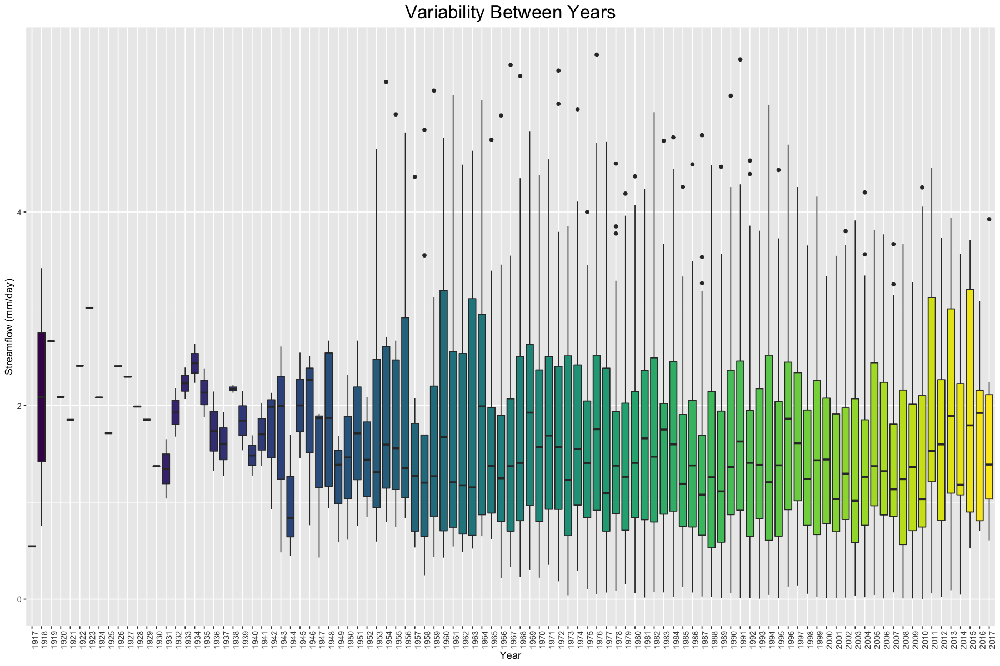

In [140]:
# plot streamflow variability between years
plot_year_variability(station.subset.60, "Streamflow", "Streamflow (mm/day)")

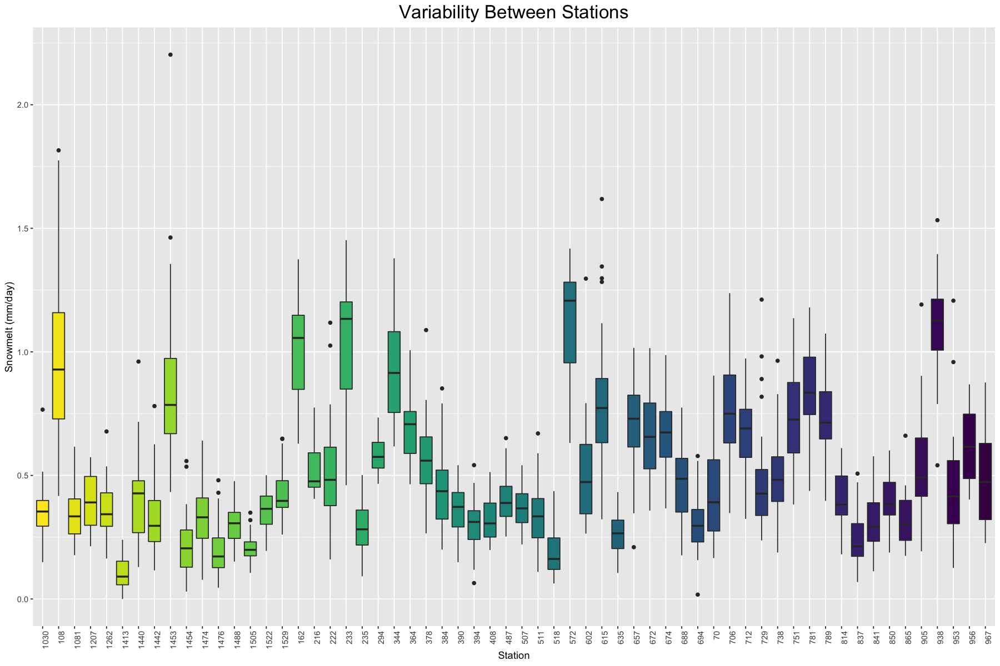

In [141]:
# plot the snowmelt variability between stations
plot_station_variability(station.subset.60, "Snowmelt", "Snowmelt (mm/day)")

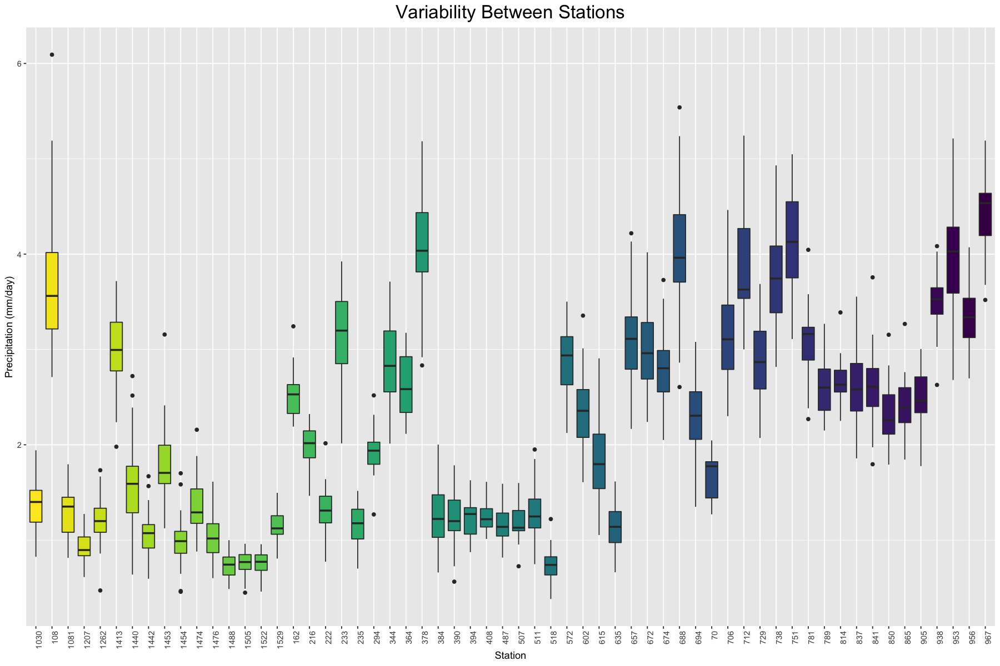

In [142]:
# plot the Precipitation variability between stations
plot_station_variability(station.subset.60, "Precipitation", "Precipitation (mm/day)")

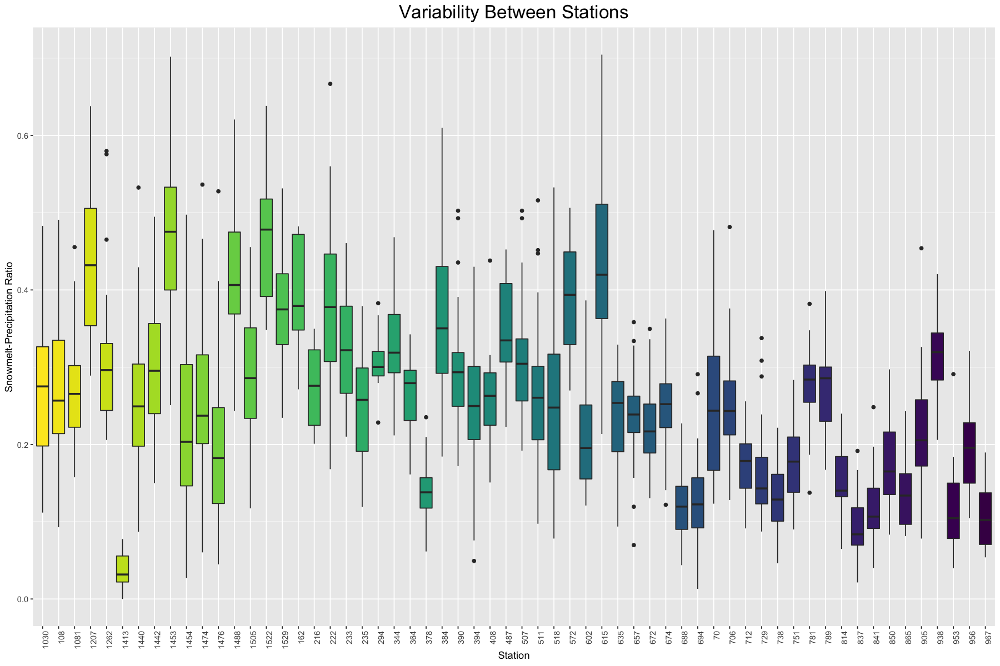

In [143]:
# plot the Snowmelt/Precipitation ratio variability between stations
plot_station_variability(station.subset.60, "Snow_Precip_Ratio", "Snowmelt-Precipitation Ratio")

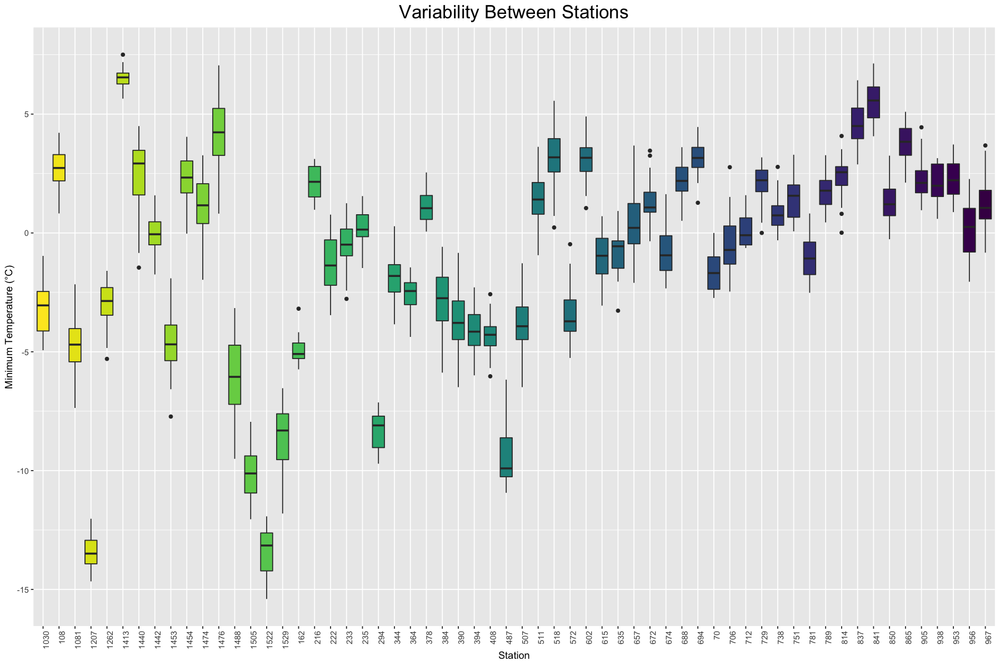

In [144]:
# plot the Snowmelt/Precipitation ratio variability between stations
plot_station_variability(station.subset.60, "T_min", "Minimum Temperature (°C)")

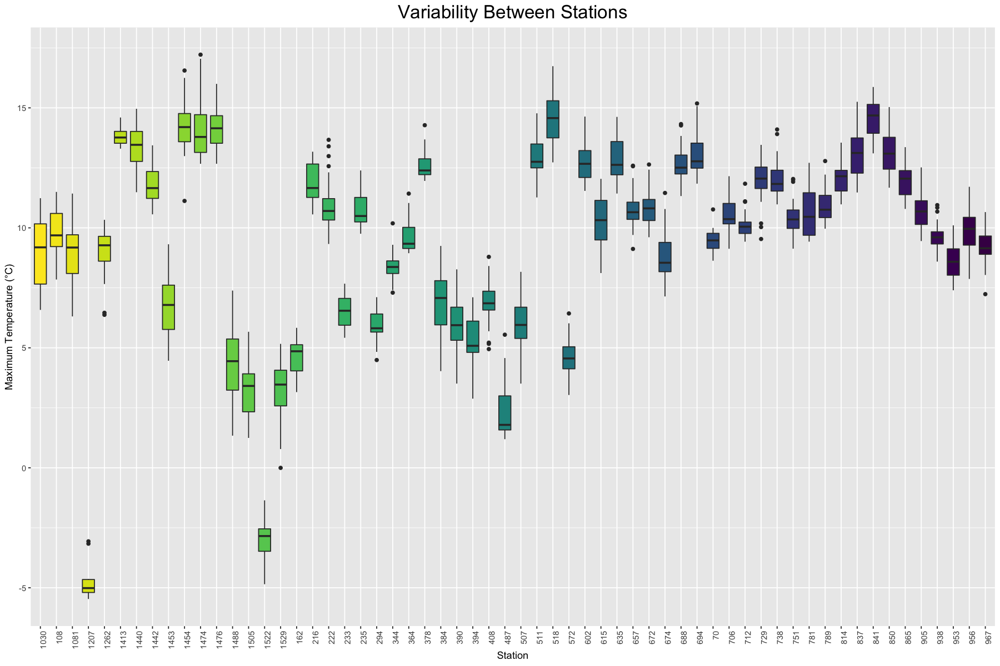

In [145]:
# plot the Snowmelt/Precipitation ratio variability between stations
plot_station_variability(station.subset.60, "T_max", "Maximum Temperature (°C)")

In [146]:
plot_relationship <- function(data, x, y){
    conf_plot <- ggplot(data, aes_string(y=y,x=x))+
            geom_point(aes_string(y=y,x=x,color="Station")) +
            geom_smooth(aes_string(y=y,x=x),method = "lm", se=TRUE) + 
            scale_color_viridis_d() + stat_smooth(aes(color=Station),method=lm, se=FALSE) +
            stat_ellipse(aes(color=Station),level=0.9)
    
    conf_plot
    
}

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



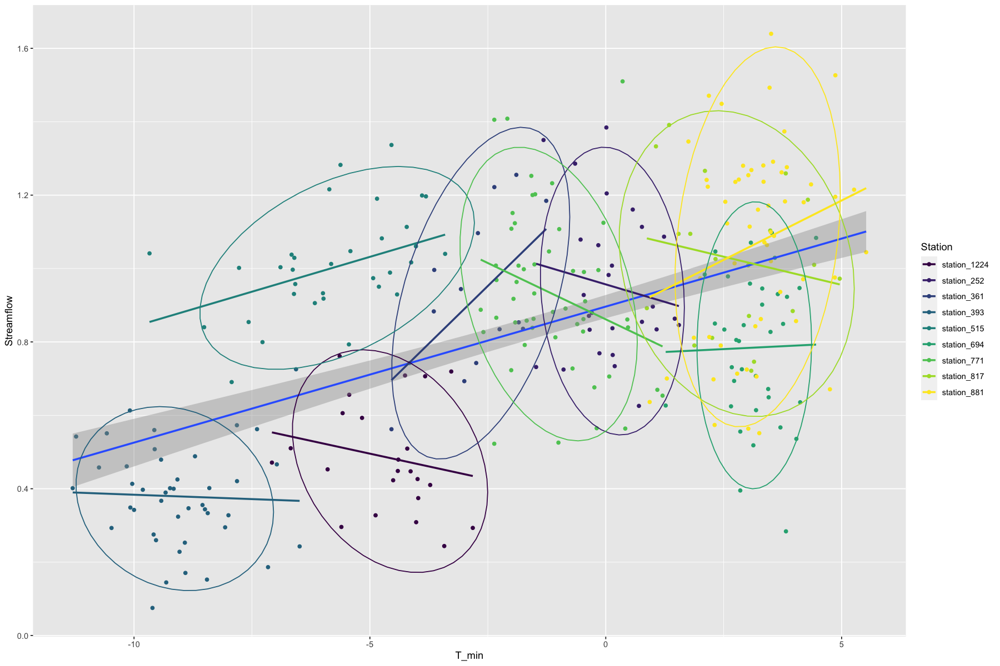

In [147]:
# plot relationship between streamflow and T_min for 9 randomly selected stations
plot_relationship(station.subset.9, "T_min", "Streamflow")

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



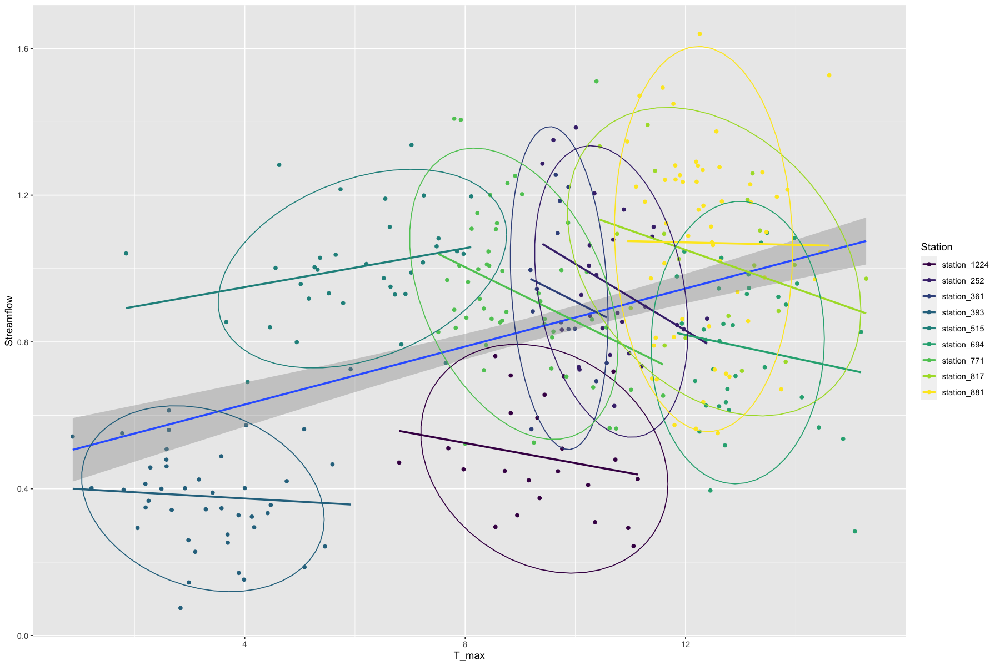

In [148]:
# plot relationship between streamflow and T_max for 9 randomly selected stations
plot_relationship(station.subset.9, "T_max", "Streamflow")

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



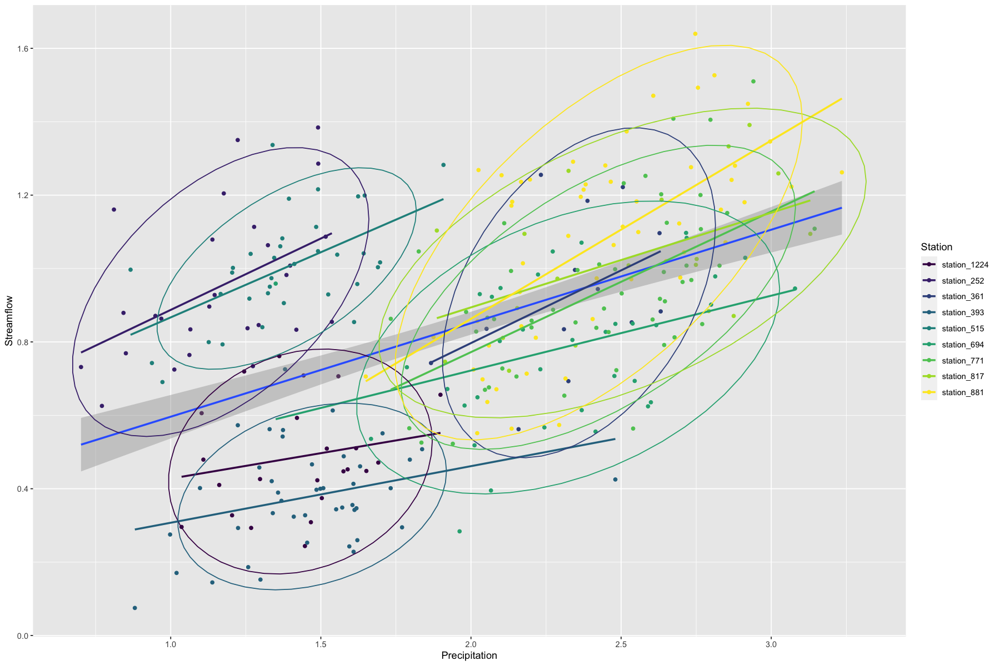

In [149]:
# plot relationship between streamflow and precipitation for 9 randomly selected stations
plot_relationship(station.subset.9, "Precipitation", "Streamflow")

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



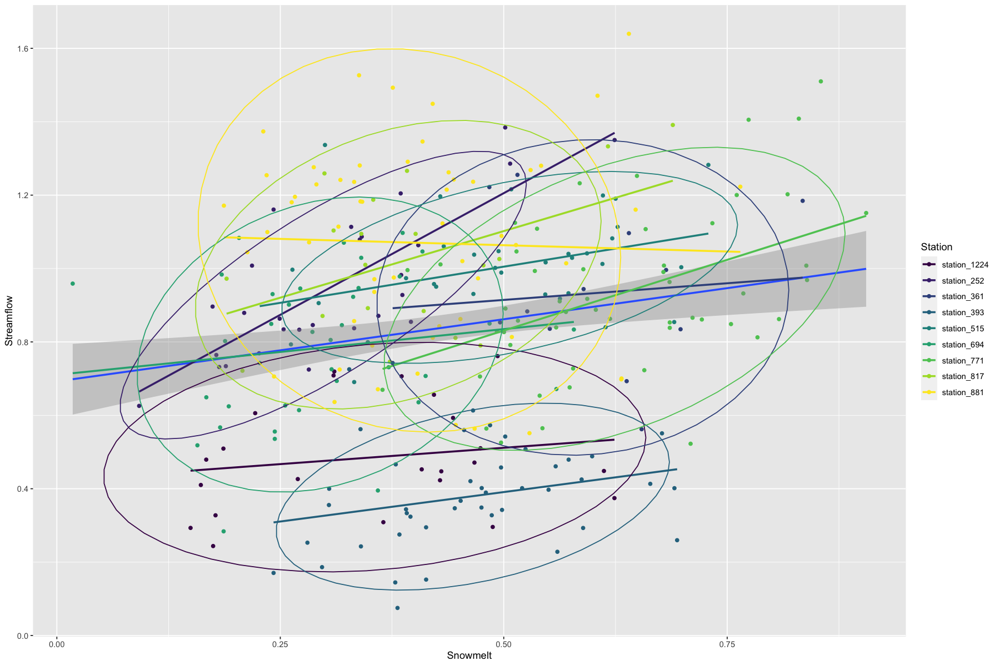

In [150]:
# plot relationship between streamflow and snowmelt for 9 randomly selected stations
plot_relationship(station.subset.9, "Snowmelt", "Streamflow")

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



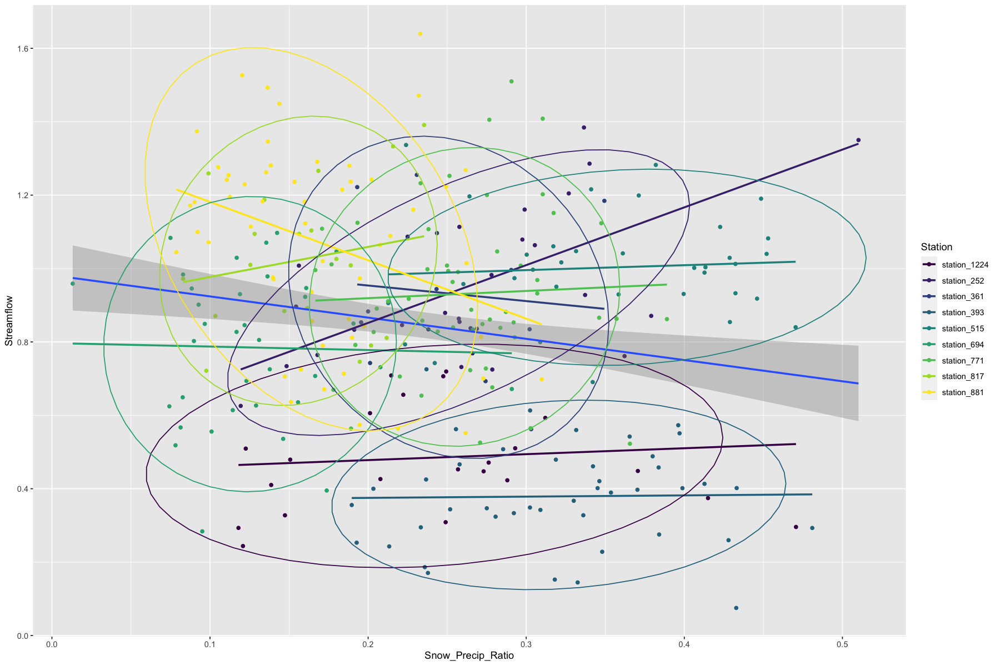

In [151]:
# plot relationship between streamflow and snow-precip ratio for 9 randomly selected stations
plot_relationship(station.subset.9, "Snow_Precip_Ratio", "Streamflow")

In [152]:
# plot parallel coordinate plot to explore pattern of variables for each station
plot_parallel_plot <- function(data){
    parallel.plot <- ggparcoord(data[complete.cases(data),] %>% 
                                select(Precipitation, Snowmelt, T_min, T_max, Snow_Precip_Ratio, Streamflow, Station),
                                columns=1:6, groupColumn=7, showPoints=TRUE, 
                                alphaLines=0.5, scale="uniminmax",  # ensure variables on same scale
                                title="Parallel Coordinate Plot for a Random Subset of Stations") + 
                    scale_color_viridis_d(direction=-1) +
                    theme(plot.title=element_text(hjust = 0.5, size=20), 
                          axis.title.x=element_blank(),
                         axis.text.x=element_text(angle=45, hjust=1)) 
    parallel.plot
}

In [153]:
# select a subset of 5 random stations with atleast 10 complete obsevations
station.subset.5 <- select_n_random_stations(data.morethan10obs, station.counts, 5, 10)

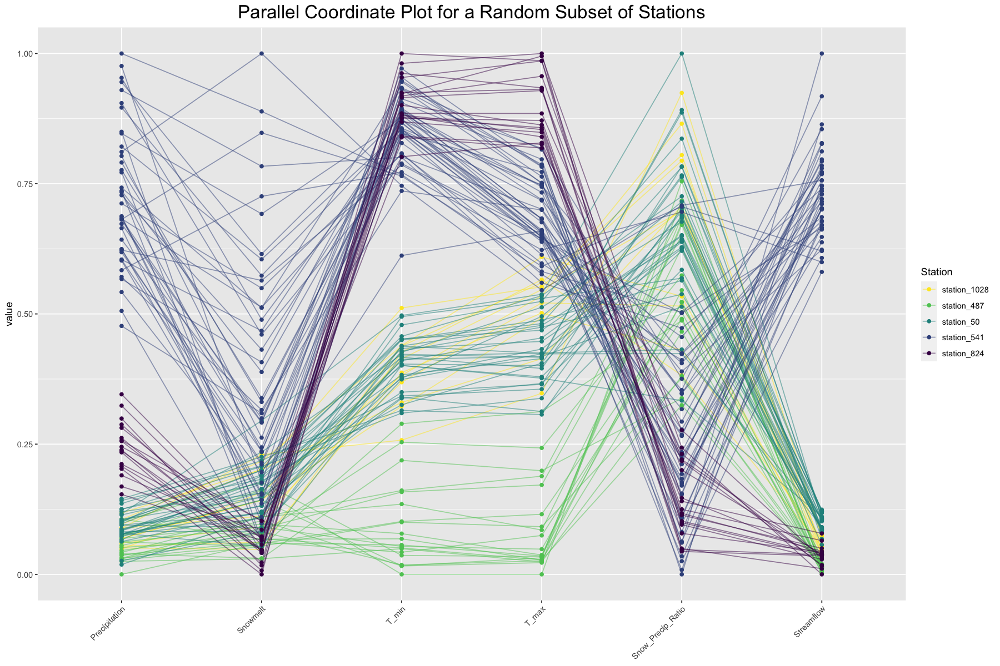

In [154]:
# visualize variable patterns for 5 randomly selected stations
plot_parallel_plot(station.subset.5)

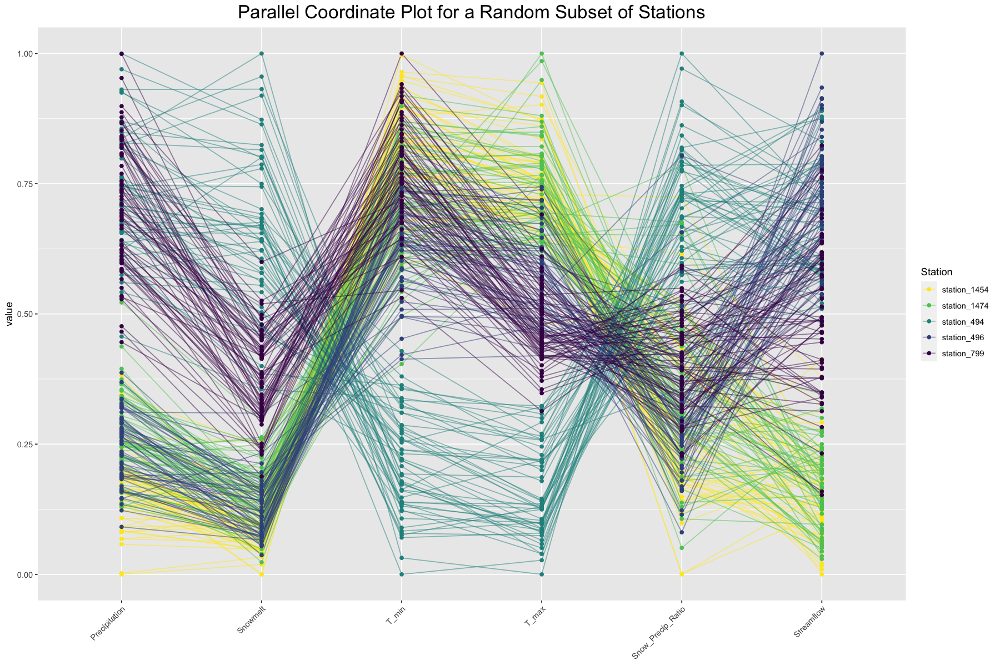

In [155]:
# take another random subset
set.seed(66)
station.subset5b <- select_n_random_stations(raw.data, station.counts, 5, 50)
plot_parallel_plot(station.subset5b)

# Modeling

## Diagnosing Serial Correlation Between Errors
+ Can often be informally detected by looking at a **time plot** of the residuals and a **lag plot** of the residuals.
    + the lag residual plot shows the residual at time t vs the residual at time t−1. If there is a strong
    relationship between the two residuals, it indicates that autocorrelation may be present. 
    + if the time plot shows a consistent pattern of runs of residuals above the 0 line and then  below the zero 
    line, this is an indication that serial correlation may be present.
+ **Durbin Watson Test**
    + test for autocorrelation: test for absence of autocorrelation (null hypothesis) vs presence of autocorrelation (alternative). 
    + small p-value (<0.05) indicates strong evidence of autocorrelation
+ Compare simple linear vs model with **AR1** errors
    + compare **AIC:** smaller AIC indicates better fit

In [156]:
# which stations have no missing observations ?
no.missing.obs <- station.counts %>% filter(pct.missing==0) %>% arrange(desc(num.observations))
head(no.missing.obs, 10)

Station,num.observations,num.missing,num.complete,pct.missing
<fct>,<int>,<int>,<int>,<dbl>
station_724,52,0,52,0
station_1350,49,0,49,0
station_199,48,0,48,0
station_740,48,0,48,0
station_662,45,0,45,0
station_1431,44,0,44,0
station_915,44,0,44,0
station_1478,41,0,41,0
station_559,40,0,40,0


In [157]:
# select top 3 (most observations) stations with no missing observations (no gaps between years) 
top.3.stations.no.missing <- no.missing.obs %>% slice(1:3)
top.3.stations.no.missing <- as.character(top.3.stations.no.missing$Station)
top.3.stations.no.missing

[1] "station_724"  "station_1350" "station_199"

In [158]:
# data for station with no missing observations and most number of observations
data.no.missing.1 <- data.morethan10obs %>% filter(Station==top.3.stations.no.missing[1])

# fit a linear regression model to data of a station with no missing observations
lin.model.1 <- lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.1)
summary(lin.model.1)


Call:
lm(formula = Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
    data = data.no.missing.1)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.72452 -0.33719 -0.00933  0.37708  1.30262 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        0.64659    0.86151   0.751    0.457    
T_min             -0.08298    0.11777  -0.705    0.484    
Precipitation      1.07930    0.21229   5.084 6.05e-06 ***
Snow_Precip_Ratio -1.78582    1.75431  -1.018    0.314    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6022 on 48 degrees of freedom
Multiple R-squared:  0.4063,	Adjusted R-squared:  0.3692 
F-statistic: 10.95 on 3 and 48 DF,  p-value: 1.351e-05


In [159]:
# lag plot and time plot of residuals to detect serially correlated errors
diagnose_autocorrelation_plots <- function(data) {
    # the lag residual plot shows the residual at time t vs the residual at time t−1. If there is a
    # strong relationship between the two residuals, it indicates that autocorrelation may be present
    lag.plot <- ggplot(data=data, aes(x=Lagged.Residual, y=Residuals)) +
                geom_point(aes(color=Residuals), show.legend=FALSE) +
                labs(title=paste("Lag Plot of Residuals")) +
                theme(plot.title=element_text(hjust=0.5, size=25),
                     text=element_text(size=20)) +
                scale_color_viridis_c(direction=-1)
    # if the time plot shows a consistent pattern of runs of residuals above the 0 line and then 
    # below the zero line, this is an indication that serial correlation may be present
    time.plot <- ggplot(data=data, aes(x=Year, y=Residuals)) +
                geom_point(aes(color=Residuals), show.legend=FALSE) +
                labs(title=paste("Time Plot of Residuals")) +
                theme(plot.title=element_text(hjust=0.5, size=25),
                     text=element_text(size=20)) + 
                geom_line() +
                geom_hline(yintercept=0, col="blue", linetype="dashed", size=1) +
                scale_color_viridis_c(direction=-1)
                
    plot_grid(time.plot, lag.plot)    
}

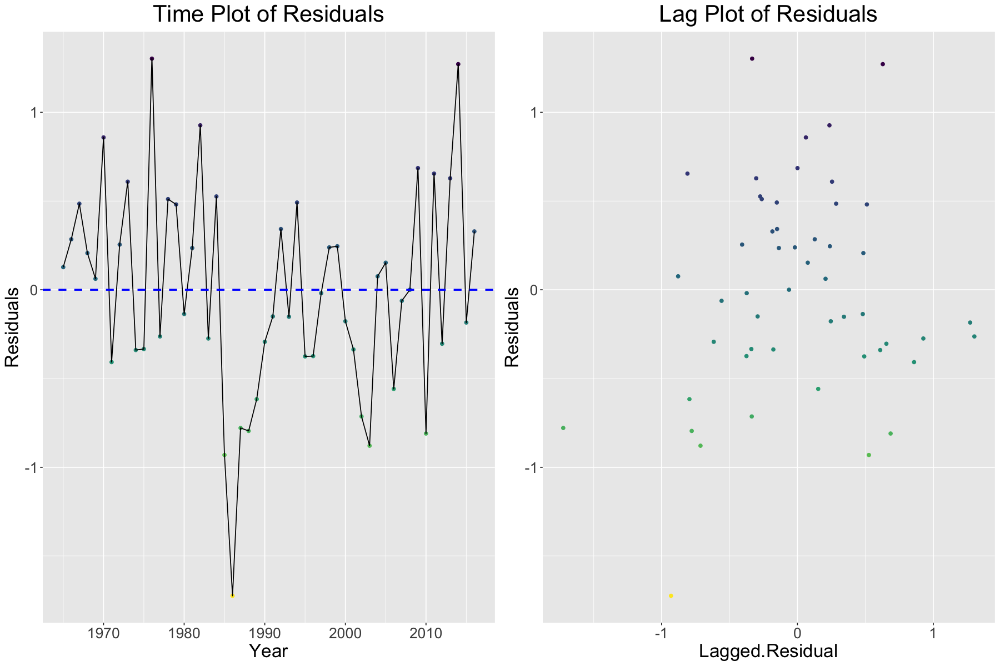

In [160]:
# autocorrelation diagnostic plots
res <- data.frame(Residuals=resid(lin.model.1), Year=data.no.missing.1$Year)
res$Lagged.Residual <- c(NA, res$Residuals[1:(length(res$Residuals)-1)])
diagnose_autocorrelation_plots(res)

In [161]:
durbinWatsonTest(lin.model.1)

 lag Autocorrelation D-W Statistic p-value
   1       0.1402451      1.712362   0.218
 Alternative hypothesis: rho != 0

In [162]:
# simple linear model with independent errrors
M1.null <- gls(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.1,
          correlation=NULL,
          na.action=na.omit)

# model with AR1 serially correlated errors
M1.AR1 <- gls(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.1,
          correlation=corAR1(form=~Year),
          na.action=na.omit)

summary(M1.AR1)

# compare models 
anova(M1.null, M1.AR1) %>% select(-Model, -call)

Generalized least squares fit by REML
  Model: Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio 
  Data: data.no.missing.1 
       AIC      BIC    logLik
  105.5737 116.8009 -46.78683

Correlation Structure: AR(1)
 Formula: ~Year 
 Parameter estimate(s):
      Phi 
0.1717435 

Coefficients:
                       Value Std.Error   t-value p-value
(Intercept)        0.8018133 0.8444098  0.949555  0.3471
T_min             -0.1039826 0.1258777 -0.826060  0.4129
Precipitation      1.0502713 0.2038091  5.153211  0.0000
Snow_Precip_Ratio -1.9445927 1.7616732 -1.103833  0.2752

 Correlation: 
                  (Intr) T_min  Prcptt
T_min             -0.363              
Precipitation     -0.825 -0.066       
Snow_Precip_Ratio -0.703  0.422  0.251

Standardized residuals:
        Min          Q1         Med          Q3         Max 
-2.87312931 -0.55972183 -0.02106561  0.62487888  2.16200781 

Residual standard error: 0.6051985 
Degrees of freedom: 52 total; 48 residual

,df,AIC,BIC,logLik,Test,L.Ratio,p-value
,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>
M1.null,5,105.0039,114.3599,-47.50193,,NA,NA
M1.AR1,6,105.5737,116.8009,-46.78683,1 vs 2,1.430197,0.2317323


In [163]:
# data for station with no missing observations and second most number of observations
data.no.missing.2 <- data.morethan10obs %>% filter(Station==top.3.stations.no.missing[2])

# fit a linear regression model to data of a station with no missing observations
lin.model.2 <- lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.2)
summary(lin.model.2)


Call:
lm(formula = Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
    data = data.no.missing.2)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.8921 -0.6119  0.1140  0.5129  1.1110 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        -1.5325     1.4238  -1.076    0.288    
T_min               0.1897     0.2025   0.937    0.354    
Precipitation       2.0434     0.1937  10.548 9.53e-14 ***
Snow_Precip_Ratio  -1.9575     2.4298  -0.806    0.425    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.7277 on 45 degrees of freedom
Multiple R-squared:  0.7244,	Adjusted R-squared:  0.706 
F-statistic: 39.43 on 3 and 45 DF,  p-value: 1.188e-12


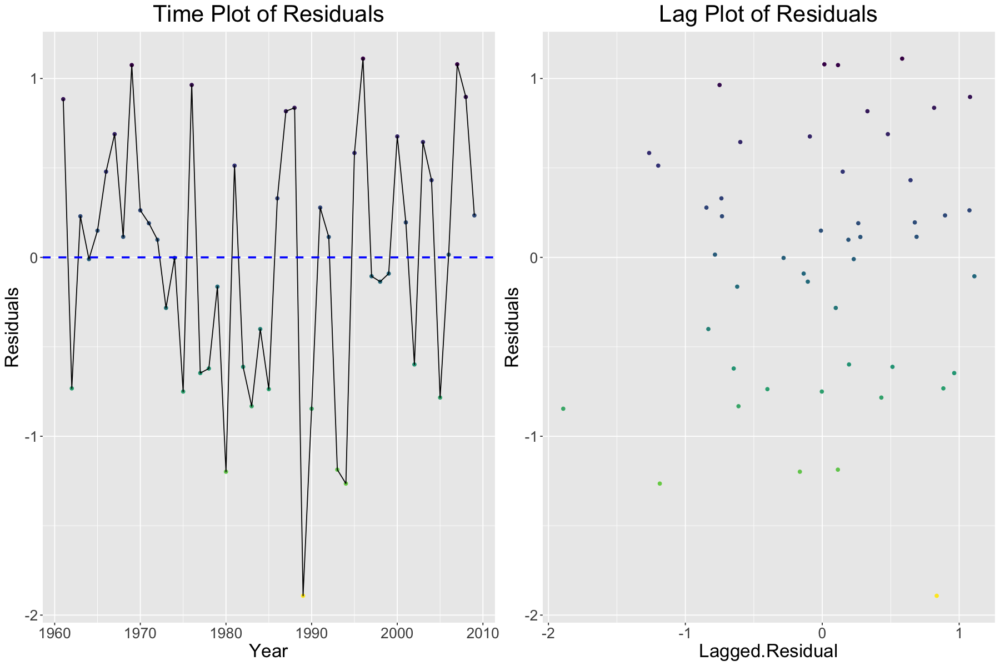

In [164]:
# autocorrelation diagnostic plots
res <- data.frame(Residuals=resid(lin.model.2), Year=data.no.missing.2$Year)
res$Lagged.Residual <- c(NA, res$Residuals[1:(length(res$Residuals)-1)])
diagnose_autocorrelation_plots(res)

In [165]:
durbinWatsonTest(lin.model.2)

 lag Autocorrelation D-W Statistic p-value
   1      0.08708118      1.790704   0.384
 Alternative hypothesis: rho != 0

In [166]:
# simple linear model with independent errrors
M1.null <- gls(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.2,
          correlation=NULL,
          na.action=na.omit)

# model with AR1 serially correlated errors
M1.AR1 <- gls(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.2,
          correlation=corAR1(form=~Year),
          na.action=na.omit)

summary(M1.AR1)

# compare models 
anova(M1.null, M1.AR1) %>% select(-Model, -call)

Generalized least squares fit by REML
  Model: Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio 
  Data: data.no.missing.2 
       AIC      BIC    logLik
  117.5943 128.4343 -52.79717

Correlation Structure: AR(1)
 Formula: ~Year 
 Parameter estimate(s):
      Phi 
0.1410381 

Coefficients:
                       Value Std.Error   t-value p-value
(Intercept)       -1.3557551 1.4569505 -0.930543  0.3571
T_min              0.1681433 0.2125706  0.791000  0.4331
Precipitation      2.0481544 0.1907328 10.738342  0.0000
Snow_Precip_Ratio -2.8236274 2.3724690 -1.190164  0.2402

 Correlation: 
                  (Intr) T_min  Prcptt
T_min             -0.900              
Precipitation     -0.349 -0.076       
Snow_Precip_Ratio -0.653  0.643 -0.032

Standardized residuals:
       Min         Q1        Med         Q3        Max 
-2.5840801 -0.8195905  0.1705238  0.6942883  1.5635201 

Residual standard error: 0.7317543 
Degrees of freedom: 49 total; 45 residual

,df,AIC,BIC,logLik,Test,L.Ratio,p-value
,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>
M1.null,5,116.3509,125.3842,-53.17543,,NA,NA
M1.AR1,6,117.5943,128.4343,-52.79717,1 vs 2,0.756521,0.3844195


In [167]:
# data for station with no missing observations and third most number of observations
data.no.missing.3 <- data.morethan10obs %>% filter(Station==top.3.stations.no.missing[3])

# fit a linear regression model to data of a station with no missing observations
lin.model.3 <- lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.3)
summary(lin.model.3)


Call:
lm(formula = Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
    data = data.no.missing.3)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.52181 -0.17763 -0.02355  0.20940  0.44645 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)       -0.44821    0.33064  -1.356  0.18216    
T_min              0.13449    0.05014   2.682  0.01026 *  
Precipitation      1.12949    0.15603   7.239 5.11e-09 ***
Snow_Precip_Ratio  1.81846    0.57834   3.144  0.00298 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2539 on 44 degrees of freedom
Multiple R-squared:  0.5514,	Adjusted R-squared:  0.5208 
F-statistic: 18.03 on 3 and 44 DF,  p-value: 8.907e-08


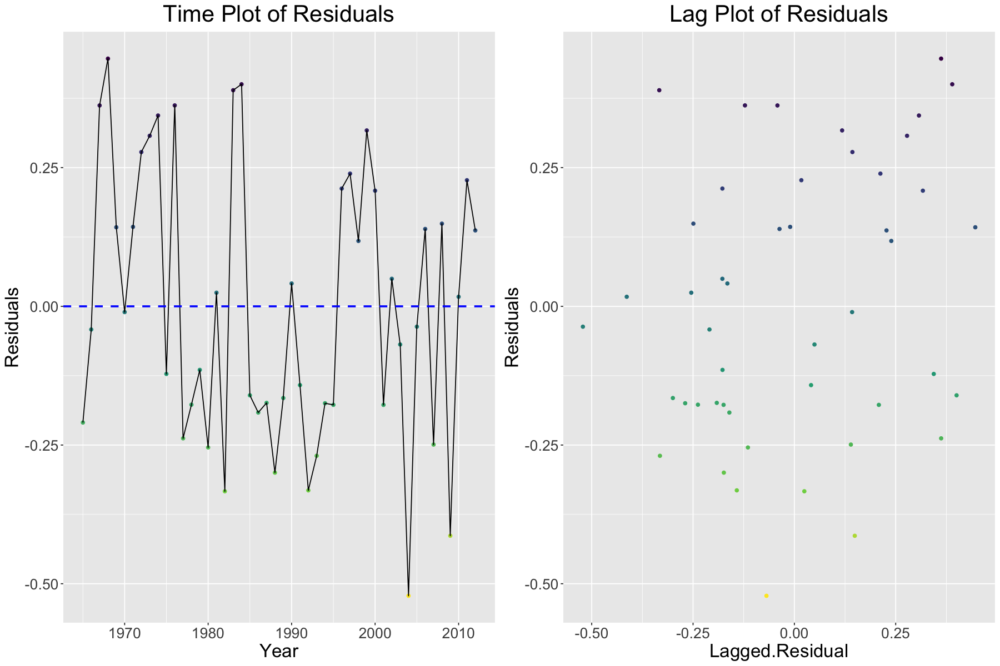

In [168]:
# autocorrelation diagnostic plots
res <- data.frame(Residuals=resid(lin.model.3), Year=data.no.missing.3$Year)
res$Lagged.Residual <- c(NA, res$Residuals[1:(length(res$Residuals)-1)])
diagnose_autocorrelation_plots(res)

In [169]:
durbinWatsonTest(lin.model.3)

 lag Autocorrelation D-W Statistic p-value
   1       0.2542019      1.469526   0.054
 Alternative hypothesis: rho != 0

In [170]:
# simple linear model with independent errrors
M1.null <- gls(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.3,
          correlation=NULL,
          na.action=na.omit)

# model with AR1 serially correlated errors
M1.AR1 <- gls(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.3,
          correlation=corAR1(form=~Year),
          na.action=na.omit)

summary(M1.AR1)

# compare models 
anova(M1.null, M1.AR1) %>% select(-Model, -call)

Generalized least squares fit by REML
  Model: Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio 
  Data: data.no.missing.3 
       AIC      BIC    logLik
  19.54493 30.25007 -3.772465

Correlation Structure: AR(1)
 Formula: ~Year 
 Parameter estimate(s):
      Phi 
0.3053026 

Coefficients:
                       Value Std.Error   t-value p-value
(Intercept)       -0.4716963 0.3084491 -1.529252  0.1334
T_min              0.1596282 0.0495265  3.223088  0.0024
Precipitation      1.1175028 0.1423437  7.850735  0.0000
Snow_Precip_Ratio  1.8295140 0.5235464  3.494464  0.0011

 Correlation: 
                  (Intr) T_min  Prcptt
T_min             -0.760              
Precipitation     -0.792  0.409       
Snow_Precip_Ratio -0.744  0.653  0.247

Standardized residuals:
        Min          Q1         Med          Q3         Max 
-2.10926602 -0.73191807 -0.07763623  0.79021558  1.73856451 

Residual standard error: 0.2564289 
Degrees of freedom: 48 total; 44 residual

,df,AIC,BIC,logLik,Test,L.Ratio,p-value
,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>
M1.null,5,21.44508,30.36603,-5.722540,,NA,NA
M1.AR1,6,19.54493,30.25007,-3.772465,1 vs 2,3.90015,0.0482818


In [171]:
# data for station with no missing observations (randomly but manually selected)
data.no.missing.rand <- data.morethan10obs %>% filter(Station=="station_915")

# fit a linear regression model to data of a station with no missing observations
lin.model.rand <- lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.rand)
summary(lin.model.rand)


Call:
lm(formula = Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
    data = data.no.missing.rand)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.6169 -0.2404 -0.1128  0.1726  1.7061 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)   
(Intercept)        0.36082    0.65387   0.552  0.58414   
T_min             -0.03238    0.05658  -0.572  0.57042   
Precipitation      0.66687    0.21043   3.169  0.00293 **
Snow_Precip_Ratio -0.81777    1.53247  -0.534  0.59655   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.461 on 40 degrees of freedom
Multiple R-squared:  0.2039,	Adjusted R-squared:  0.1442 
F-statistic: 3.416 on 3 and 40 DF,  p-value: 0.02635


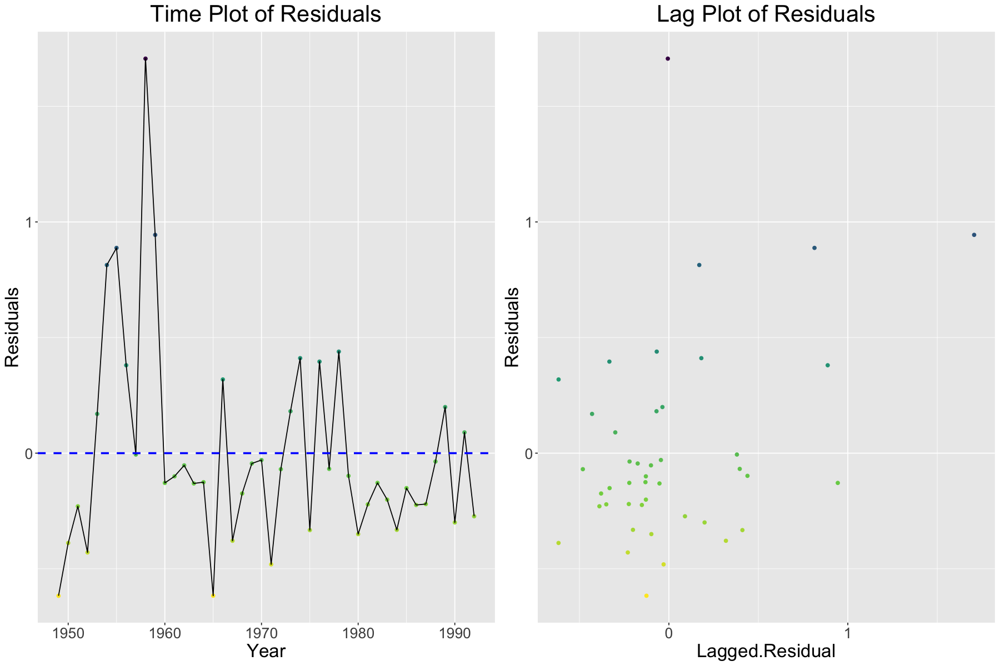

In [172]:
# autocorrelation diagnostic plots
res <- data.frame(Residuals=resid(lin.model.rand), Year=data.no.missing.rand$Year)
res$Lagged.Residual <- c(NA, res$Residuals[1:(length(res$Residuals)-1)])
diagnose_autocorrelation_plots(res)

In [175]:
# simple linear model with independent errrors
M1.null <- gls(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.rand,
          correlation=NULL,
          na.action=na.omit)

# model with AR1 serially correlated errors
M1.AR1 <- gls(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.missing.rand,
          correlation=corAR1(form=~Year),
          na.action=na.omit)

summary(M1.AR1)

# compare models 
anova(M1.null, M1.AR1) %>% select(-Model, -call)

Generalized least squares fit by REML
  Model: Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio 
  Data: data.no.missing.rand 
       AIC      BIC   logLik
  64.83659 74.96987 -26.4183

Correlation Structure: AR(1)
 Formula: ~Year 
 Parameter estimate(s):
      Phi 
0.4095821 

Coefficients:
                       Value Std.Error    t-value p-value
(Intercept)        0.8411980 0.6373110  1.3199174  0.1944
T_min             -0.0281753 0.0466375 -0.6041343  0.5492
Precipitation      0.5135238 0.1895314  2.7094383  0.0099
Snow_Precip_Ratio -1.1094014 1.5127869 -0.7333495  0.4676

 Correlation: 
                  (Intr) T_min  Prcptt
T_min             -0.066              
Precipitation     -0.836 -0.287       
Snow_Precip_Ratio -0.523  0.626  0.002

Standardized residuals:
       Min         Q1        Med         Q3        Max 
-1.3248882 -0.5189220 -0.2183905  0.3101371  3.6696606 

Residual standard error: 0.4696223 
Degrees of freedom: 44 total; 40 residual

,df,AIC,BIC,logLik,Test,L.Ratio,p-value
,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>
M1.null,5,69.37825,77.82265,-29.68913,,NA,NA
M1.AR1,6,64.83659,74.96987,-26.41830,1 vs 2,6.54166,0.0105377


## Observations:
There is no strong evidence of the presence of autocorrelation in model1 (station 724) and model2 (station 1350). There is evidence of autocorrelation in model3 (station 199) and model.rand (station 915); however, even if the AR1 model appears like a better fit to the data, the conclusions are the same (judgement of significance for all variables is the same).

## Checking Model Assumptions
+ Variance homogeneity, linearity
    + Residuals vs Fitted value plot: must show no clear pattern
+ Normality of errors
    + histogram of standadized residuals: must be normally distributed around 0
+ Absence of multicollinearity
    + VIF: large (> 5) VIF values suggest presence of multicollinearity
+ Absence of outliers
    + cook's distance: outlier if cook's distance > 4/n, n is number of observations

In [180]:
# plot cook's distance for each observation, points above the dashed can be considered as outliers
plot_cooks <- function(model){
    n <- nobs(model)
    plot <- ggplot(model, aes(x=as.factor(seq_along(.cooksd)), y=.cooksd, size=.cooksd)) +
                geom_point(aes(color=seq_along(.cooksd)), show.legend=FALSE) +
                labs(title=paste("Cook's Distance ")) +
                ylab("Cook's Distance") + xlab("Observation Index") +
                theme(plot.title=element_text(hjust=0.5, size=25),
                     text=element_text(size=20), axis.text.x=element_text(angle=90, hjust=1)) +
                geom_hline(yintercept=4/n, col="blue", linetype="dashed", size=1) +
                scale_color_viridis_c(direction=-1)
    plot
    
}

In [181]:
# plot residual vs fitted values
plot_resid_vs_fitted <- function(data){
    plot <- ggplot(data, aes(x=Fitted, y=Residuals)) + 
    geom_point(aes(color=Residuals), size=2.5, alpha=0.9, show.legend=FALSE) + 
    xlab("Fitted Value") +
    theme(plot.title=element_text(hjust=0.5, size=30),
         text=element_text(size=15)) + 
    stat_smooth(method="loess") + geom_hline(yintercept=0, col="red", linetype="dashed", size=1) +
    scale_color_viridis_c(direction=-1)
    plot
}

# plot histogram for a given variable
plot_histogram <- function(data, name, binwidth) {
    histogram <- ggplot(data, aes(value, fill=cut(value, 20))) + 
                geom_histogram(show.legend=FALSE, binwidth=binwidth) + 
                theme(plot.title=element_text(hjust = 0.5, size=20), 
                      text=element_text(size=15)) + 
                xlab(name) +
                scale_fill_viridis_d()
    histogram
}

# plot residual vs fitted and histogram of residuals
check_residuals <- function(model){
    # plot the residuals vs the fitted values
    fitted.vs.resid <-data.frame(Fitted=fitted(model), 
                             Residuals=resid(model, type="pearson"))
    fitted <- plot_resid_vs_fitted(fitted.vs.resid)
    # plot distribution of residuals
    hist <- plot_histogram(data.frame(value=resid(model, type="pearson")), "Residuals", 0.7)

    plot_grid(fitted, hist)
}

`geom_smooth()` using formula 'y ~ x'



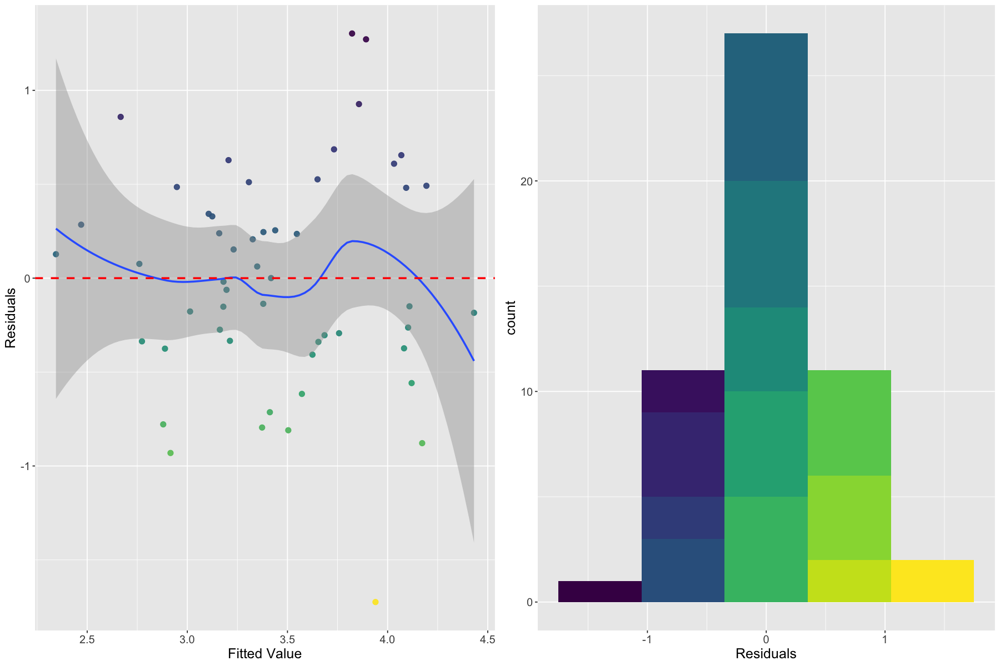

In [182]:
# check variance homogeneity and error normality assumptions
check_residuals(lin.model.1)

In [183]:
# check for multicollinearity
vif(lin.model.1)

T_min     Precipitation Snow_Precip_Ratio 
         1.254883          1.130984          1.347186

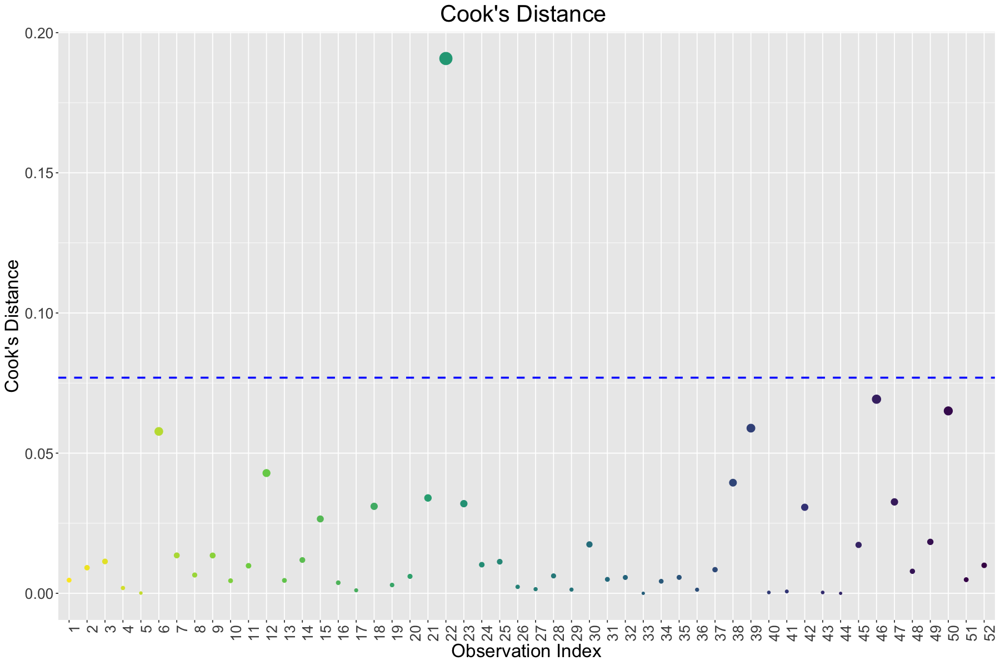

In [184]:
# check for presence of outliers
plot_cooks(lin.model.1)

## Observations:
all assumptions seem reasonable except for presence of outliers. It appears that observation number 22 is an outlier. Let's see if the model improves by removing this observation.

In [186]:
# remove the influence of outliers
data.no.outliers.1 <- data.no.missing.1[-22,]
model1.no.outliers <- lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.outliers.1)
summary(model1.no.outliers)


Call:
lm(formula = Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
    data = data.no.outliers.1)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.96603 -0.37999 -0.00267  0.33752  1.23118 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)         0.6626     0.7858   0.843    0.403    
T_min              -0.1617     0.1101  -1.469    0.149    
Precipitation       1.1604     0.1952   5.944 3.27e-07 ***
Snow_Precip_Ratio  -2.3023     1.6078  -1.432    0.159    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5493 on 47 degrees of freedom
Multiple R-squared:  0.4893,	Adjusted R-squared:  0.4567 
F-statistic: 15.01 on 3 and 47 DF,  p-value: 5.494e-07


In [187]:
print(c(AIC(lin.model.1), AIC(model1.no.outliers)))

[1] 100.67032  89.45502


`geom_smooth()` using formula 'y ~ x'



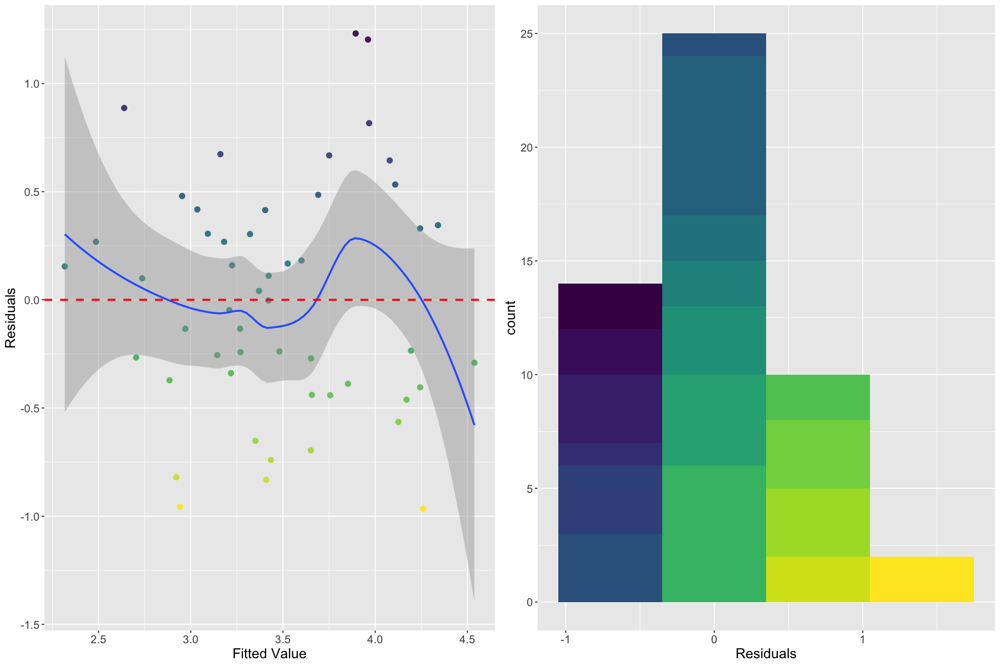

In [188]:
# check variance homogeneity and error normality assumptions
check_residuals(model1.no.outliers)

In [189]:
# check for multicollinearity
vif(model1.no.outliers)

T_min     Precipitation Snow_Precip_Ratio 
         1.281673          1.133741          1.357352

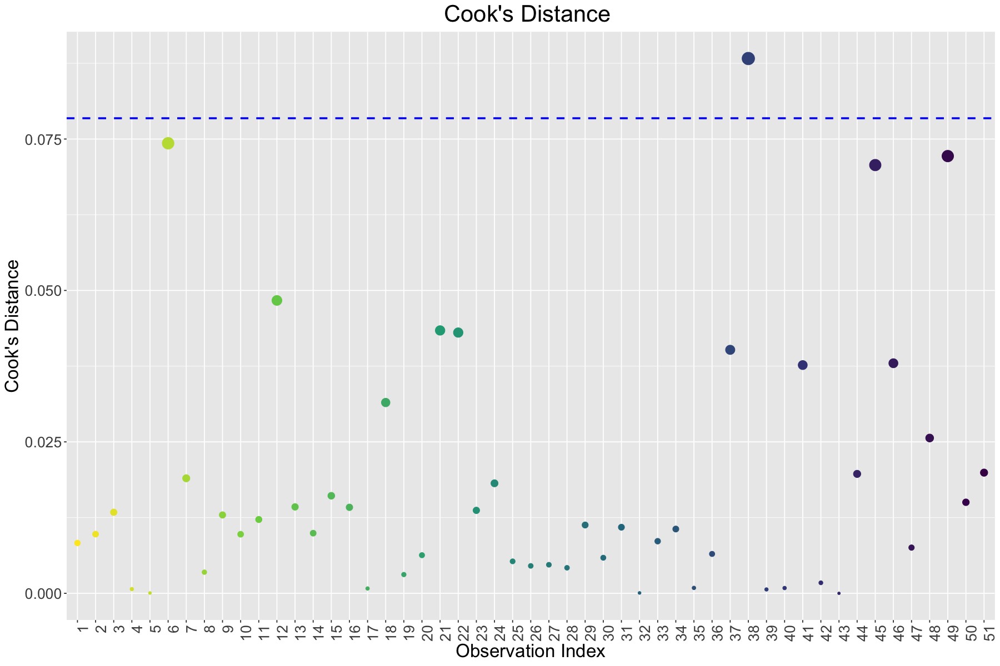

In [190]:
# check for presence of outliers
plot_cooks(model1.no.outliers)

In [191]:
# remove the influence of outliers
data.no.outliers.1 <- data.no.outliers.1[-38, ]
model1.no.outliers.2 <- lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.outliers.1)
summary(model1.no.outliers.2)


Call:
lm(formula = Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
    data = data.no.outliers.1)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.9365 -0.4123  0.0126  0.3215  1.1749 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)         0.3088     0.7873   0.392    0.697    
T_min              -0.1656     0.1072  -1.545    0.129    
Precipitation       1.2617     0.1974   6.392 7.45e-08 ***
Snow_Precip_Ratio  -1.9397     1.5767  -1.230    0.225    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5347 on 46 degrees of freedom
Multiple R-squared:  0.5258,	Adjusted R-squared:  0.4949 
F-statistic:    17 on 3 and 46 DF,  p-value: 1.429e-07


In [192]:
print(c(AIC(model1.no.outliers), AIC(model1.no.outliers.2)))

[1] 89.45502 85.11771


`geom_smooth()` using formula 'y ~ x'



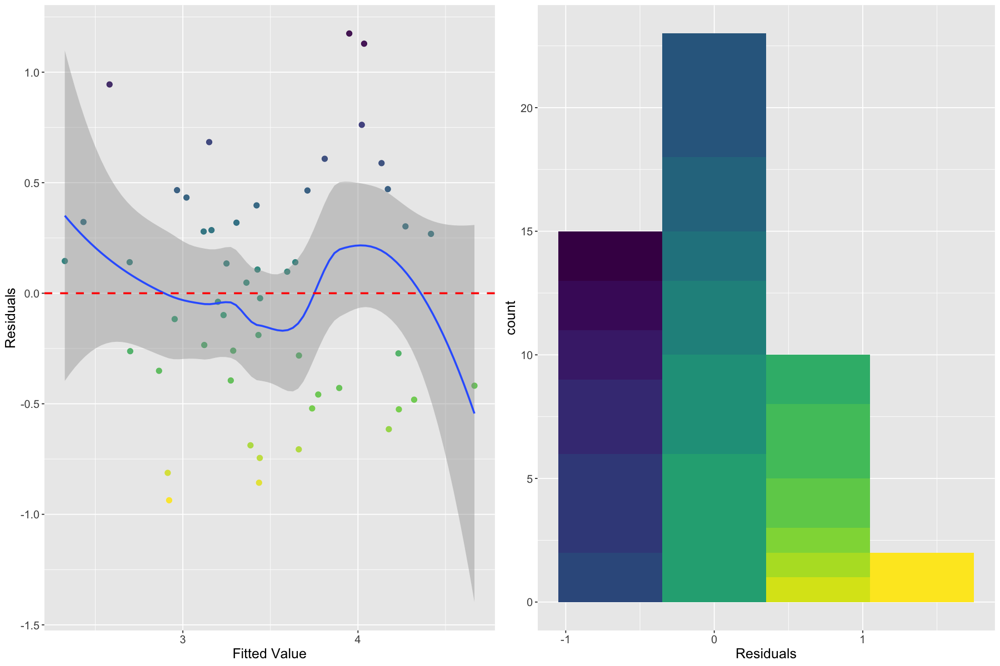

In [193]:
# check variance homogeneity and error normality assumptions
check_residuals(model1.no.outliers.2)

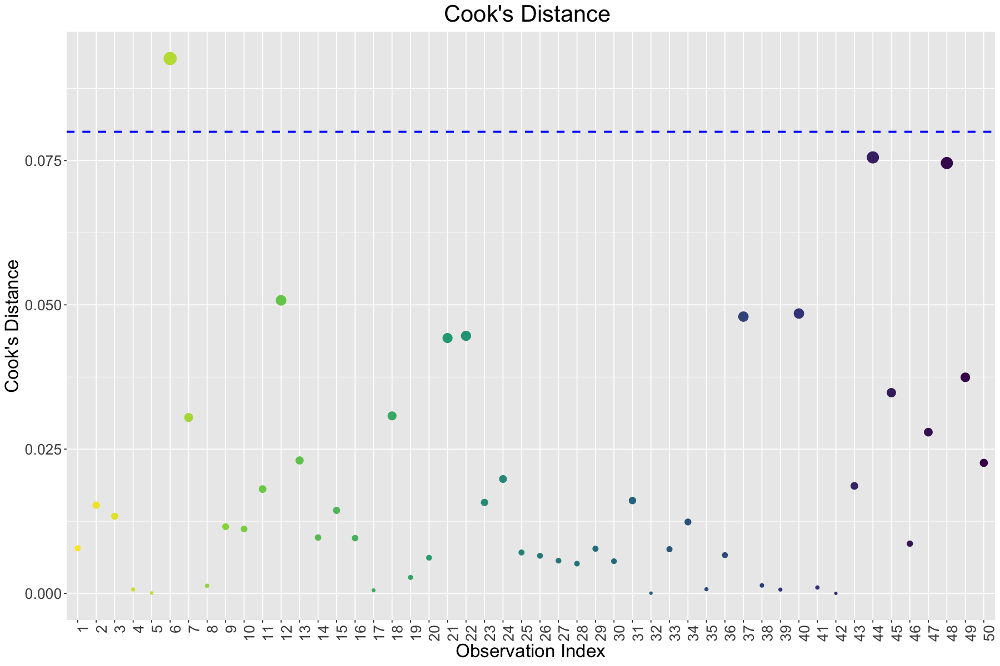

In [194]:
plot_cooks(model1.no.outliers.2)

In [195]:
# remove the influence of outliers
data.no.outliers.1 <- data.no.outliers.1[-6, ]
model1.no.outliers.3 <- lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
          data=data.no.outliers.1)
summary(model1.no.outliers.3)


Call:
lm(formula = Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
    data = data.no.outliers.1)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.87419 -0.43246  0.01066  0.37636  1.15666 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)       -0.08297    0.79244  -0.105    0.917    
T_min             -0.17318    0.10428  -1.661    0.104    
Precipitation      1.36808    0.19982   6.847 1.72e-08 ***
Snow_Precip_Ratio -1.63679    1.54125  -1.062    0.294    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5199 on 45 degrees of freedom
Multiple R-squared:  0.5614,	Adjusted R-squared:  0.5322 
F-statistic:  19.2 on 3 and 45 DF,  p-value: 3.659e-08


In [196]:
print(c(AIC(model1.no.outliers.2), AIC(model1.no.outliers.3)))

[1] 85.11771 80.77920


`geom_smooth()` using formula 'y ~ x'



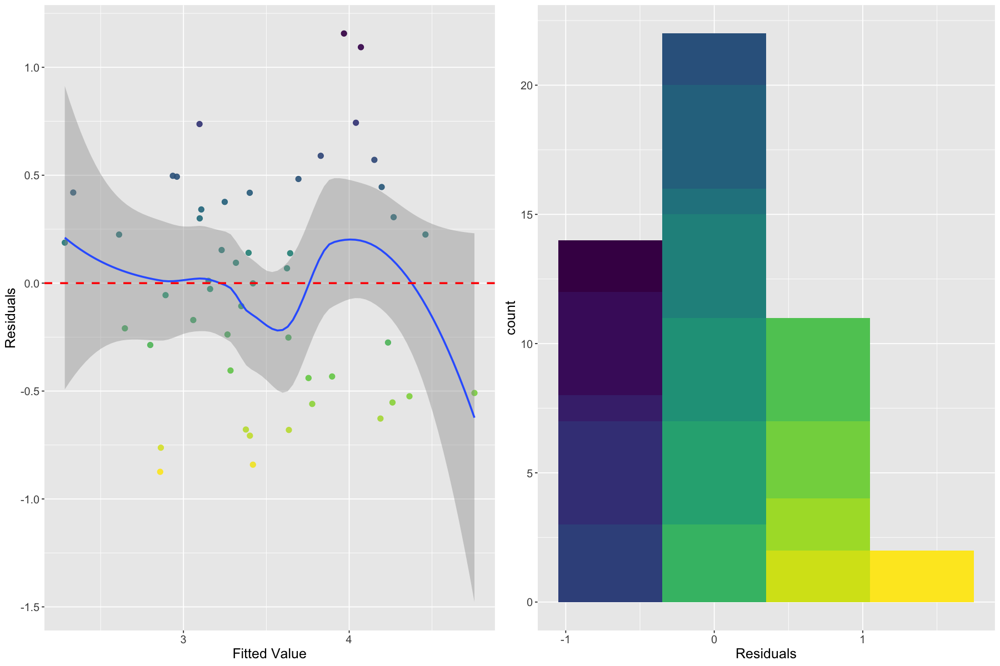

In [197]:
# check variance homogeneity and error normality assumptions
check_residuals(model1.no.outliers.3)

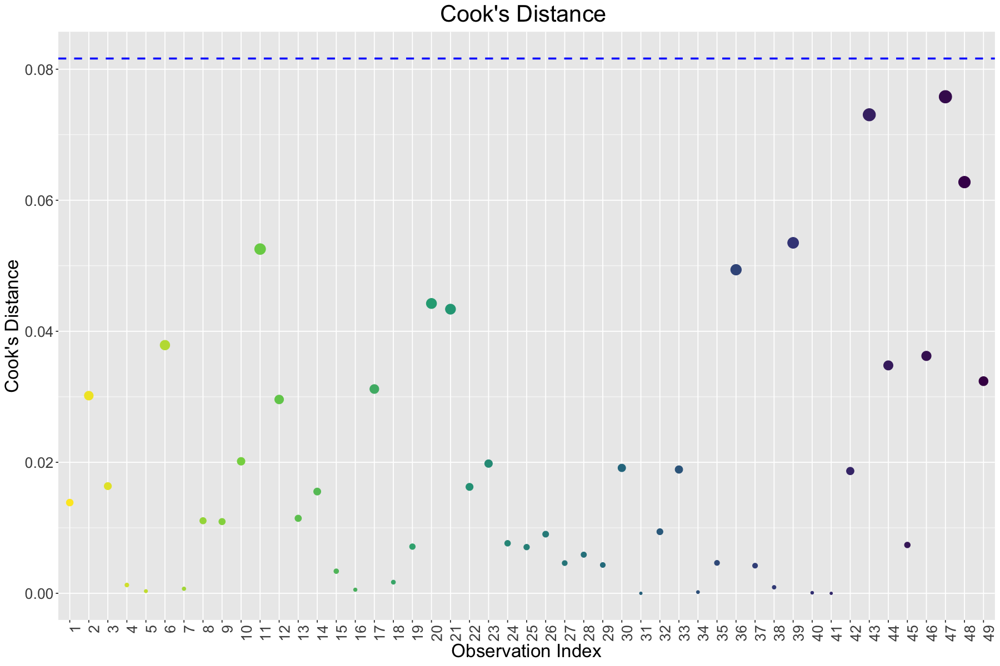

In [198]:
plot_cooks(model1.no.outliers.3)

## Observations:
After some iterative removal of outliers, the fit improved significantly. The **AIC** went down from 100.67 to 80.77, the $R^2$ (variance explained by the model) went up from 0.406 to 0.561, and all model assumptions seem reasonable.

`geom_smooth()` using formula 'y ~ x'



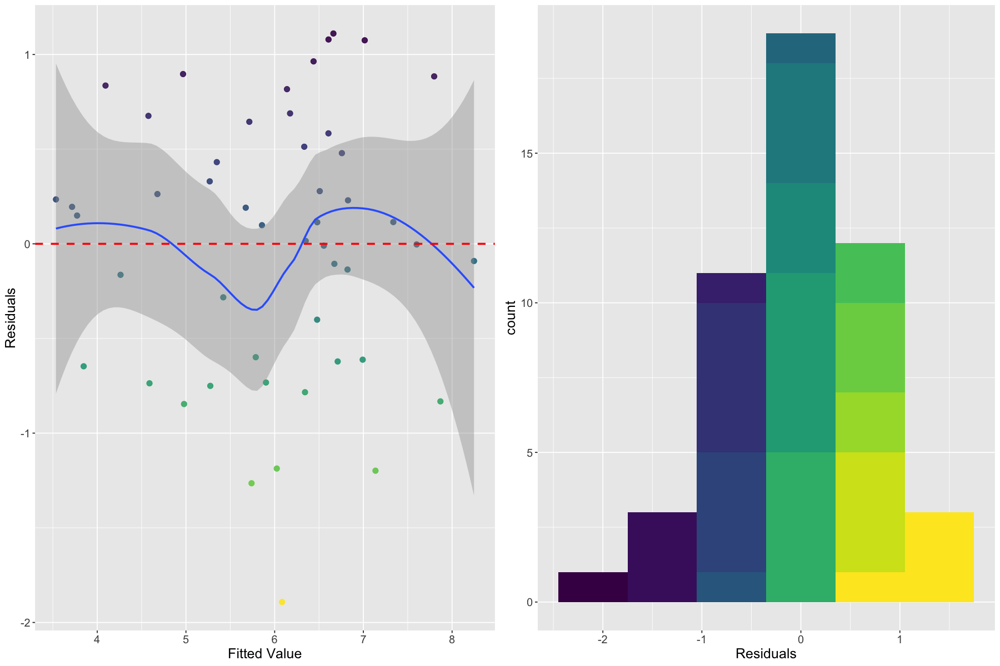

In [199]:
# check variance homogeneity and error normality assumptions
check_residuals(lin.model.2)

In [200]:
# check for multicollinearity
vif(lin.model.2)

T_min     Precipitation Snow_Precip_Ratio 
         1.760422          1.003662          1.755768

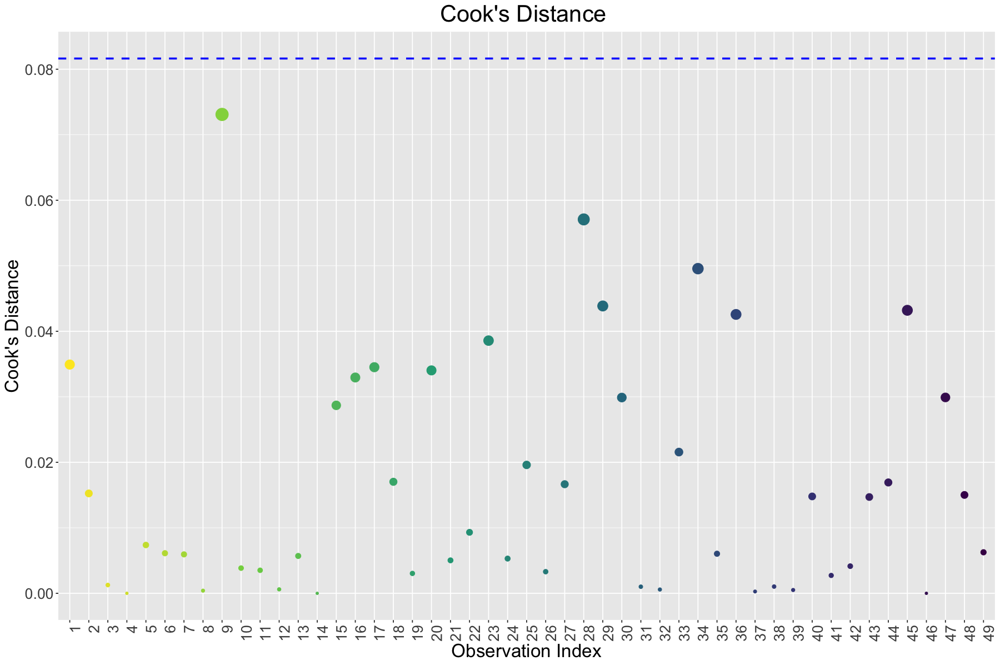

In [201]:
# check for presence of outliers
plot_cooks(lin.model.2)

## Observations:
All model assumptions seem reasonable.

In [202]:
model <- lin.model.2

In [203]:
summary(model)


Call:
lm(formula = Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
    data = data.no.missing.2)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.8921 -0.6119  0.1140  0.5129  1.1110 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        -1.5325     1.4238  -1.076    0.288    
T_min               0.1897     0.2025   0.937    0.354    
Precipitation       2.0434     0.1937  10.548 9.53e-14 ***
Snow_Precip_Ratio  -1.9575     2.4298  -0.806    0.425    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.7277 on 45 degrees of freedom
Multiple R-squared:  0.7244,	Adjusted R-squared:  0.706 
F-statistic: 39.43 on 3 and 45 DF,  p-value: 1.188e-12


In [207]:
confint(model)

,2.5 %,97.5 %
(Intercept),-4.4001863,1.3351421
T_min,-0.2181408,0.5976287
Precipitation,1.6532017,2.4335813
Snow_Precip_Ratio,-6.8512737,2.9362658


In [208]:
options(contrasts = c("contr.sum", "contr.poly"))
Anova(model, type="III")

,Sum Sq,Df,F value,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),0.6135549,1,1.1585650,2.875003e-01
T_min,0.4648976,1,0.8778581,3.537905e-01
Precipitation,58.9179800,1,111.2537965,9.530349e-14
Snow_Precip_Ratio,0.3437279,1,0.6490554,4.246874e-01
Residuals,23.8311786,45,NA,NA


In [209]:
summary(model)


Call:
lm(formula = Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
    data = data.no.missing.2)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.8921 -0.6119  0.1140  0.5129  1.1110 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)        -1.5325     1.4238  -1.076    0.288    
T_min               0.1897     0.2025   0.937    0.354    
Precipitation       2.0434     0.1937  10.548 9.53e-14 ***
Snow_Precip_Ratio  -1.9575     2.4298  -0.806    0.425    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.7277 on 45 degrees of freedom
Multiple R-squared:  0.7244,	Adjusted R-squared:  0.706 
F-statistic: 39.43 on 3 and 45 DF,  p-value: 1.188e-12


In [212]:
# calculate the confidence intervals for every station
conf.ints <- data.morethan10obs %>% group_by(Station) %>% 
            do(confint=data.frame(Lower=confint(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.))[-1,1], Estimate=coefficients(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.))[-1], Upper=confint(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.))[-1,2]))


In [213]:
# combine the conf intervals into a single data structure
c.ints <- cbind(do.call("rbind", conf.ints$confint), 
                data.frame(Station=rep(conf.ints$Station, each=3))) %>% rownames_to_column
    
head(c.ints)

,rowname,Lower,Estimate,Upper,Station
,<chr>,<dbl>,<dbl>,<dbl>,<fct>
1,T_min,-0.017246744,0.0002299512,0.01770665,station_1
2,Precipitation,-0.005189612,0.1011803709,0.20755035,station_1
3,Snow_Precip_Ratio,-0.402929191,-0.0306612149,0.34160676,station_1
4,T_min1,-0.023560656,0.0037868420,0.03113434,station_10
5,Precipitation1,-0.024701718,0.3275684137,0.67983854,station_10
6,Snow_Precip_Ratio1,-0.598008851,-0.1145479598,0.36891293,station_10


In [214]:
# get the confidence intervals for each attribute
tmin.confints <- c.ints %>% filter(str_detect(rowname,"T_min"))
precip.confints <- c.ints %>% filter(str_detect(rowname,"Precipitation"))
snowratio.confints <- c.ints %>% filter(str_detect(rowname,"Snow_Precip_Ratio"))

In [221]:
c.ints.long <- rbind(tmin.confints, precip.confints, snowratio.confints)

In [215]:
# plot the confidence intervals
plot_intervals <- function(data){
    data <- data %>% mutate(Station=gsub('.*_([0-9]+).*','\\1', Station))
    plot <- ggplot(data, aes(x=Station, y=Estimate)) + 
    geom_point(aes(color=Estimate), size=2.5, alpha=0.9, show.legend=FALSE) + 
    xlab("Station") +
    theme(plot.title=element_text(hjust=0.5, size=30),
         text=element_text(size=15), axis.text.x=element_text(angle=90, hjust=1)) +
    geom_errorbar(aes(ymin=Lower, ymax=Upper), width=.6,
                 position=position_dodge(0.2)) +
    geom_hline(yintercept=0, col="blue", linetype="dashed", size=1) +
    scale_color_viridis_c(direction=-1)
    plot
}

plot_conf_ints <- function(precip.ints, tmin.ints, ratio.ints){
    precip <- plot_intervals(precip.ints)
    tmin <- plot_intervals(tmin.ints)
    snowratio <- plot_intervals(ratio.ints)
    
    plot_grid(precip, tmin, snowratio, nrow=1, ncol=3, labels=c("Precipitation", "T_min", "Snow-to-Precipitation-Ratio")) 
}


In [222]:
# select 30 random stations
set.seed(451)
s <- c.ints.long %>% select(Station) %>% unique() %>% sample_n(30)
s <- as.vector(s$Station)

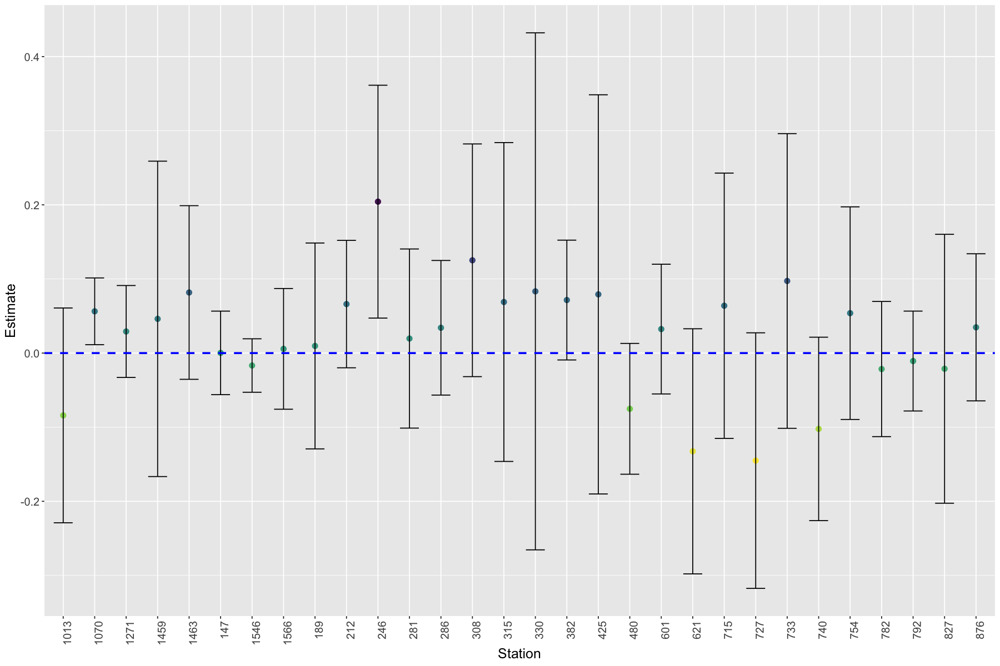

In [223]:
# conf ints for tmin
plot_intervals(tmin.confints %>% filter(Station %in% s))

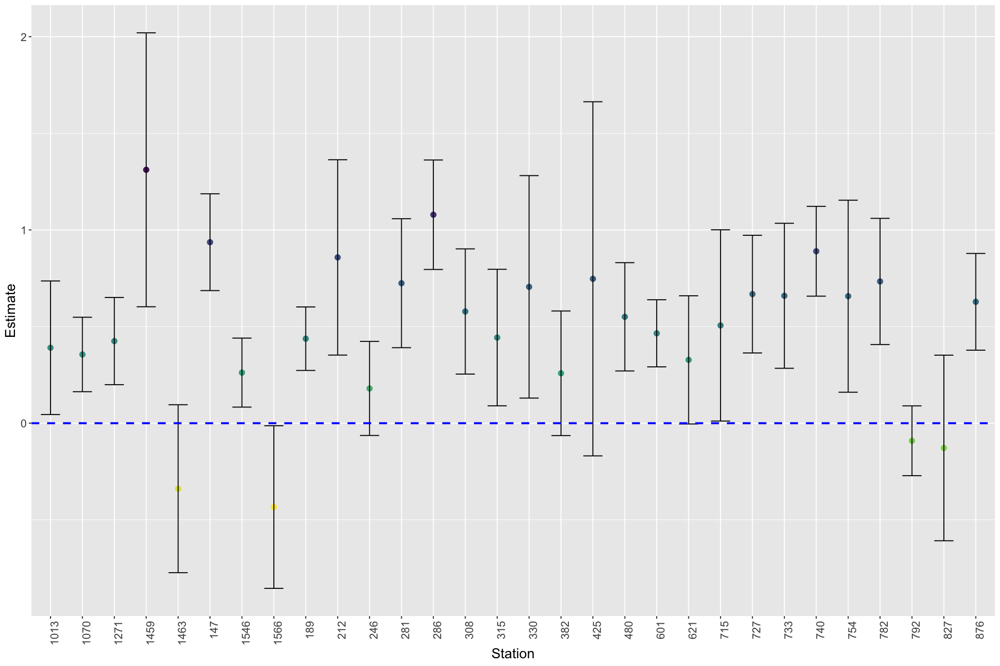

In [224]:
# conf ints for precip
plot_intervals(precip.confints %>% filter(Station %in% s))

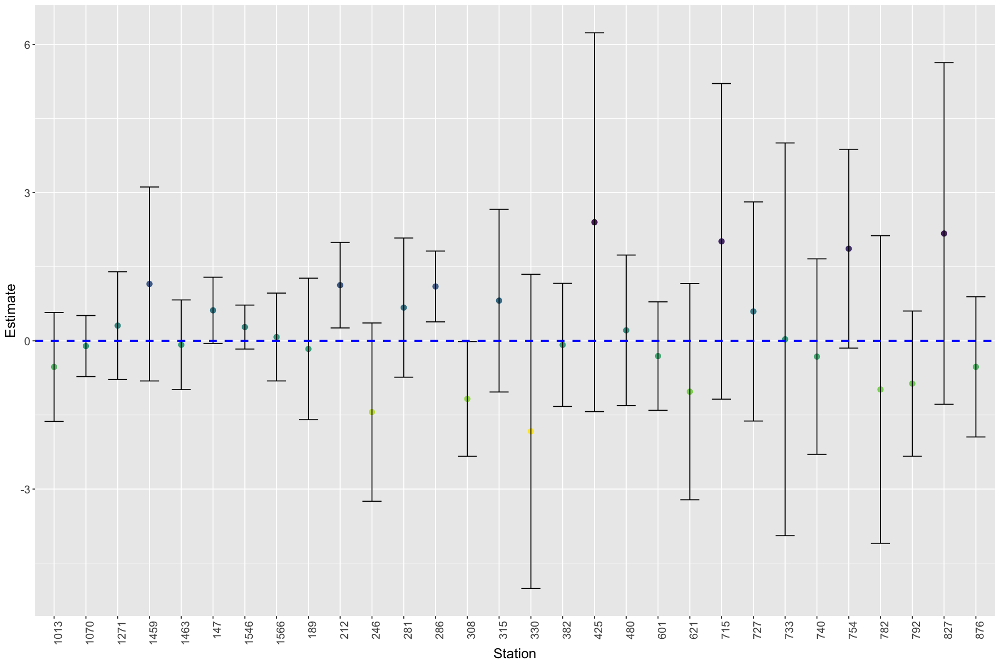

In [225]:
# conf ints for snowratio
plot_intervals(snowratio.confints %>% filter(Station %in% s))

In [259]:
options(contrasts = c("contr.sum", "contr.poly"))
# What proportion of Sum of Squares of Regression comes from each variable??
importances.linear <-data.morethan10obs %>% group_by(Station) %>% 
                    do(T_min=Anova(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.), type="III")["T_min",1] / 
                       sum(head(Anova(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.), type="III")[,1], -1)),
                       Precipitation=Anova(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.), type="III")["Precipitation",1] / 
                       sum(head(Anova(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.), type="III")[,1], -1)),
                       Snow_Precip_Ratio=Anova(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.), type="III")["Snow_Precip_Ratio",1] / 
                       sum(head(Anova(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.), type="III")[,1], -1)),
                       T_min.sig=Anova(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.), type="III")["T_min","Pr(>F)"] < 0.05,
                       Precipitation.sig=Anova(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.), type="III")["Precipitation","Pr(>F)"] < 0.05,
                       Snow_Precip_Ratio.sig=Anova(lm(Streamflow ~ T_min + Precipitation + Snow_Precip_Ratio, 
                                            data=.), type="III")["Snow_Precip_Ratio","Pr(>F)"] < 0.05)                                      

In [260]:
head(importances.linear)

Station,T_min,Precipitation,Snow_Precip_Ratio,T_min.sig,Precipitation.sig,Snow_Precip_Ratio.sig
<fct>,<list>,<list>,<list>,<list>,<list>,<list>
station_1,0.0001641047,0.8576746,0.006430364,FALSE,FALSE,FALSE
station_10,0.007344338,0.3311966,0.02150233,FALSE,FALSE,FALSE
station_1003,0.01847105,0.7191032,0.2435374,FALSE,TRUE,TRUE
station_1004,0.0825428,0.908086,3.15773e-05,FALSE,TRUE,FALSE
station_1013,0.04153844,0.1577346,0.02826383,FALSE,TRUE,FALSE
station_102,0.09377393,0.52778,0.1555345,FALSE,FALSE,FALSE


In [261]:
coord <- read.csv("stations.csv", header=TRUE)
head(coord)

,Station.Number,Station.Name,Province,Status,Latitude,Longitude,Year.From,Year.To,Gross.Drainage.Area..km2.,Effective.Drainage.Area..km2.,Regulation,Data.Type,Operation.Schedule,Sediment,RHBN,Real.Time,Datum.Name,Publishing.Office,Operating.Agency,Contributed
,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
1,01AA002,DAAQUAM (RIVIERE) EN AVAL DE LA RIVIERE SHIDGEL,QC,Discontinued,46.55750,-70.08111,1967,1977,598.00,NA,N,Flow,Continuous,N,N,N,ARBITRAIRE,QUEBEC CITY,MINISTERE DE L'ENVIRONNEMENT DU QUEBEC,Y
2,01AA004,GAUTHIER (RIVIERE) A SON EMBOUCHURE,QC,Discontinued,46.80083,-70.13806,1975,1981,16.60,NA,N,Level,Seasonal,N,N,N,ARBITRAIRE,QUEBEC CITY,MINISTERE DE L'ENVIRONNEMENT DU QUEBEC,Y
3,01AB001,BUCKLEY (RIVIERE) EN AVAL DU LAC JOHNNY,QC,Discontinued,46.87917,-70.08750,1973,1981,6.94,NA,N,Level,Seasonal,N,N,N,ARBITRAIRE,QUEBEC CITY,MINISTERE DE L'ENVIRONNEMENT DU QUEBEC,Y
4,01AD001,MADAWASKA (RIVIÈRE) À 6 KM EN AVAL DU BARRAGE TÉMISCOUATA,QC,Discontinued,47.54833,-68.63639,1918,2005,2690.00,NA,R,Flow,Continuous,N,N,N,ARBITRAIRE,QUEBEC CITY,MINISTERE DE L'ENVIRONNEMENT DU QUEBEC,Y
5,01AD002,SAINT JOHN RIVER AT FORT KENT,NB,Active,47.25806,-68.59583,1926,2020,14700.00,NA,N,Flow,Continuous,N,Y,N,INTERNATIONAL BOUNDARY COMMISSION DATUM,DARTMOUTH,UNITED STATES GEOLOGICAL SURVEY,Y
6,01AD003,ST. FRANCIS RIVER AT OUTLET OF GLASIER LAKE,NB,Active,47.20661,-68.95694,1951,2020,1350.00,NA,N,Flow and Level,Continuous,N,Y,Y,ASSUMED DATUM,DARTMOUTH,,N


In [262]:
coords <- coord[, c("Latitude", "Longitude", "Province")]
head(coords)

,Latitude,Longitude,Province
,<dbl>,<dbl>,<fct>
1,46.55750,-70.08111,QC
2,46.80083,-70.13806,QC
3,46.87917,-70.08750,QC
4,47.54833,-68.63639,QC
5,47.25806,-68.59583,NB
6,47.20661,-68.95694,NB


In [263]:
# select 886 random locations
indices <- sample(1:nrow(coords), num.stations)
rand.coords <- coords[indices,]
head(rand.coords)

,Latitude,Longitude,Province
,<dbl>,<dbl>,<fct>
5806,58.99167,-111.40000,AB
7929,49.48917,-115.10417,BC
1360,45.31697,-75.09167,ON
6804,51.36500,-118.80639,BC
3438,50.68855,-114.24491,AB
8163,49.83194,-119.96472,BC


In [264]:
stations <- importances.linear$Station
rand.coords <- rand.coords %>% mutate(Station=as.factor(stations))
head(rand.coords)

,Latitude,Longitude,Province,Station
,<dbl>,<dbl>,<fct>,<fct>
1,58.99167,-111.40000,AB,station_1
2,49.48917,-115.10417,BC,station_10
3,45.31697,-75.09167,ON,station_1003
4,51.36500,-118.80639,BC,station_1004
5,50.68855,-114.24491,AB,station_1013
6,49.83194,-119.96472,BC,station_102


In [265]:
importances.linear <- full_join(importances.linear, rand.coords, by="Station")
head(importances.linear)

Station,T_min,Precipitation,Snow_Precip_Ratio,T_min.sig,Precipitation.sig,Snow_Precip_Ratio.sig,Latitude,Longitude,Province
<fct>,<list>,<list>,<list>,<list>,<list>,<list>,<dbl>,<dbl>,<fct>
station_1,0.0001641047,0.8576746,0.006430364,FALSE,FALSE,FALSE,58.99167,-111.40000,AB
station_10,0.007344338,0.3311966,0.02150233,FALSE,FALSE,FALSE,49.48917,-115.10417,BC
station_1003,0.01847105,0.7191032,0.2435374,FALSE,TRUE,TRUE,45.31697,-75.09167,ON
station_1004,0.0825428,0.908086,3.15773e-05,FALSE,TRUE,FALSE,51.36500,-118.80639,BC
station_1013,0.04153844,0.1577346,0.02826383,FALSE,TRUE,FALSE,50.68855,-114.24491,AB
station_102,0.09377393,0.52778,0.1555345,FALSE,FALSE,FALSE,49.83194,-119.96472,BC


In [266]:
# get the name of the most important variable
imps <- importances.linear %>% select(Precipitation, T_min, Snow_Precip_Ratio) 
most_imp_var <- colnames(imps)[apply(imps,MARGIN=1,FUN=which.max)]

# add the most important variable name
importances.linear <- cbind(importances.linear, most_imp_var)

head(importances.linear)

,Station,T_min,Precipitation,Snow_Precip_Ratio,T_min.sig,Precipitation.sig,Snow_Precip_Ratio.sig,Latitude,Longitude,Province,most_imp_var
,<fct>,<list>,<list>,<list>,<list>,<list>,<list>,<dbl>,<dbl>,<fct>,<fct>
1,station_1,0.0001641047,0.8576746,0.006430364,FALSE,FALSE,FALSE,58.99167,-111.40000,AB,Precipitation
2,station_10,0.007344338,0.3311966,0.02150233,FALSE,FALSE,FALSE,49.48917,-115.10417,BC,Precipitation
3,station_1003,0.01847105,0.7191032,0.2435374,FALSE,TRUE,TRUE,45.31697,-75.09167,ON,Precipitation
4,station_1004,0.0825428,0.908086,3.15773e-05,FALSE,TRUE,FALSE,51.36500,-118.80639,BC,Precipitation
5,station_1013,0.04153844,0.1577346,0.02826383,FALSE,TRUE,FALSE,50.68855,-114.24491,AB,Precipitation
6,station_102,0.09377393,0.52778,0.1555345,FALSE,FALSE,FALSE,49.83194,-119.96472,BC,Precipitation


In [267]:
# how many stations consider each variable statistically significant?
precip.count <- sum(unlist(importances.linear %>% select(Precipitation.sig)))
tmin.count <- sum(unlist(importances.linear %>% select(T_min.sig)))
snowratio.count <- sum(unlist(importances.linear %>% select(Snow_Precip_Ratio.sig)))

sig.count <- data.frame(Variable=c("Precipitation", "Snow_Precip_Ratio", "T_min"), 
                        Significant=c(precip.count, snowratio.count, tmin.count))

In [268]:
sig.count

Variable,Significant
<fct>,<int>
Precipitation,644
Snow_Precip_Ratio,120
T_min,93


In [269]:
most.imp.counts

Variable,Most Important
<fct>,<int>
Precipitation,735
Snow_Precip_Ratio,88
T_min,63


In [270]:
# count the number of stations where each variable is considered the most important
# and the number of stations where each variable is considered significant
counts <- sig.count %>% full_join(most.imp.counts, by="Variable")

In [271]:
# turn into long format for plotting
counts.long <- counts %>% gather("Type", "Count", -Variable)

In [272]:
head(counts.long)

,Variable,Type,Count
,<fct>,<chr>,<int>
1,Precipitation,Significant,644
2,Snow_Precip_Ratio,Significant,120
3,T_min,Significant,93
4,Precipitation,Most Important,735
5,Snow_Precip_Ratio,Most Important,88
6,T_min,Most Important,63


In [278]:
# plot side to side barcharts for the # of stations that consider each factor most important
# and the  # of stations that consider each factor statistically significantly different from 0 
plot_counts <- function(data){
    hist <- ggplot(data, aes(x=Variable, y=Count, fill=Type)) + 
        geom_bar(position = "dodge", stat="identity", colour="black") + 
        geom_text(aes(label=Count), position=position_dodge(width=0.9), vjust=-0.25, size=10) +
        scale_fill_manual(labels = c("Considered most \nimportant", "Considered \nsignificant"), 
                          values = c("#736F6E", rgb(0/255, 151/255, 150/255))) +
        ylab("Number of Stations") + xlab("Climatic Factor") +
        theme(text=element_text(size=25),
             plot.background = element_rect(fill = "transparent", colour = NA),
             legend.title=element_blank(), 
             legend.position=c(1,1), 
             legend.justification = c("right","top"),
             legend.background=element_blank(),
             legend.key.height=unit(4,"line"),
             legend.key.width=unit(4,"line"))
    hist
}

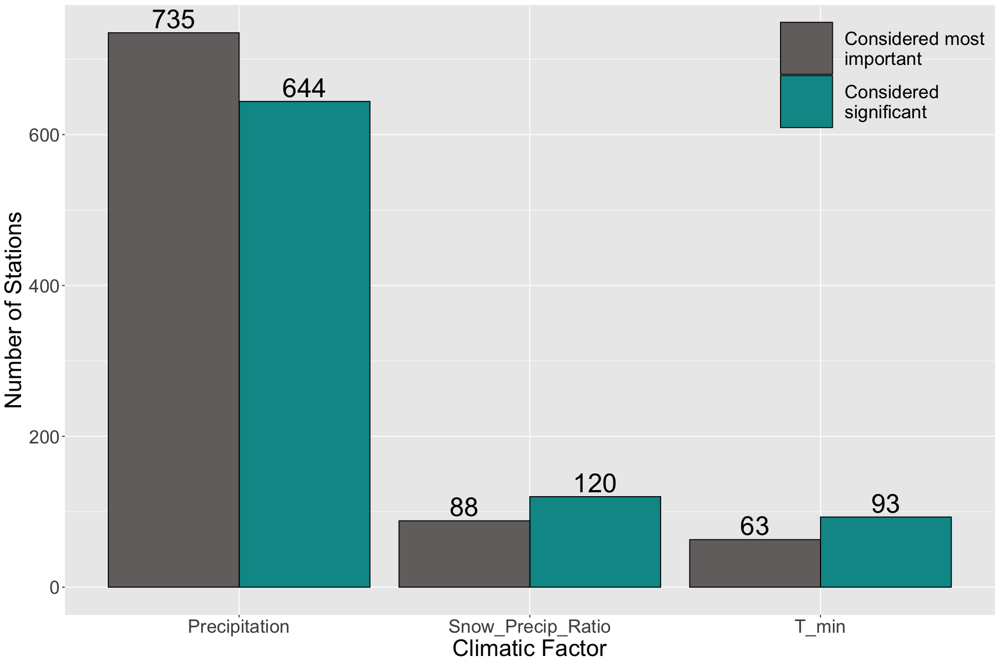

In [279]:
plot_counts(counts.long)

In [280]:
# psize defines whether the most important variable is statistically significant or not
# psize = 2 indicates statistically significant and psize = 1 indicates not 
# statistically significant
importances.linear <- importances.linear %>%
  mutate(
    psize = case_when(
      most_imp_var == "Precipitation" & Precipitation.sig == TRUE ~ 2,
      most_imp_var == "Snow_Precip_Ratio" & Snow_Precip_Ratio.sig == TRUE ~ 2,
      most_imp_var == "T_min" & T_min.sig == TRUE ~ 2,
      TRUE ~ 1
    )
  ) 


# turn lat and lon into point
importances.linear <- importances.linear %>% 
          st_as_sf(coords = c("Longitude", "Latitude"), crs = 4326) %>%
          st_transform(3978) %>% st_as_sf()

dir.create("aoc_75M")
aoc_url <- "http://ftp.geogratis.gc.ca/pub/nrcan_rncan/vector/atlas/75m_prod/geog/shape"
aoc_layers <- list(layer = "pvp", ext = c(".dbf", ".shp", ".shx")) %>% 
          cross_df() %>%
          mutate(url = paste0(aoc_url, "/", layer, ext, ".zip"),
            zip_name = map2_chr(url, file.path("aoc_75M", basename(url)), 
                                curl::curl_download))

walk(aoc_layers$zip_name, unzip, exdir = "aoc_75M")
provinces <- read_sf("aoc_75M/pvp.shp") %>% filter(REG_CODE != 0) %>%
  st_set_crs(4326) %>% st_transform(3978) %>% st_as_sf()

In [281]:
head(importances.linear)

,Station,T_min,Precipitation,Snow_Precip_Ratio,T_min.sig,Precipitation.sig,Snow_Precip_Ratio.sig,Province,most_imp_var,psize,geometry
,<fct>,<list>,<list>,<list>,<list>,<list>,<list>,<fct>,<fct>,<dbl>,<POINT [m]>
1,station_1,0.0001641047,0.8576746,0.006430364,FALSE,FALSE,FALSE,AB,Precipitation,1,POINT (-907543.9 1212683)
2,station_10,0.007344338,0.3311966,0.02150233,FALSE,FALSE,FALSE,BC,Precipitation,1,POINT (-1429792 282211.1)
3,station_1003,0.01847105,0.7191032,0.2435374,FALSE,TRUE,TRUE,ON,Precipitation,2,POINT (1560103 -166437.6)
4,station_1004,0.0825428,0.908086,3.15773e-05,FALSE,TRUE,FALSE,BC,Precipitation,2,POINT (-1605813 565986.6)
5,station_1013,0.04153844,0.1577346,0.02826383,FALSE,TRUE,FALSE,AB,Precipitation,2,POINT (-1331012 390126.1)
6,station_102,0.09377393,0.52778,0.1555345,FALSE,FALSE,FALSE,BC,Precipitation,1,POINT (-1744839 439259.6)


In [282]:
# plot the most important variable for each station
plot_map <- function(provinces, data, legend=TRUE, showy=TRUE){
  data <- data %>% mutate(significance=case_when(psize==2 ~ "Significant", psize==1 ~ "Not Significant"))  
  imp.map <- ggplot() + 
              layer_spatial(provinces, size=0.2) +
              geom_sf(data, mapping=aes(col=most_imp_var, fill=most_imp_var), alpha=0.8, show.legend=legend) +
              labs(col="Variable") +
              scale_color_viridis_d() + scale_fill_viridis_d(guide=FALSE) + 
              theme(text=element_text(size=15),
                    plot.background = element_rect(fill = "transparent", colour = NA),
                    strip.text.x=element_text(size=20, face="bold"),
                    legend.position=c(1,1), 
                    legend.justification = c("right","top"),
                    legend.background=element_blank(),
                    legend.key.height=unit(2,"line")) +
                    guides(color = guide_legend(override.aes = list(size=3))) +
                    annotation_scale() + facet_wrap(~significance)    
              
  imp.map 
}

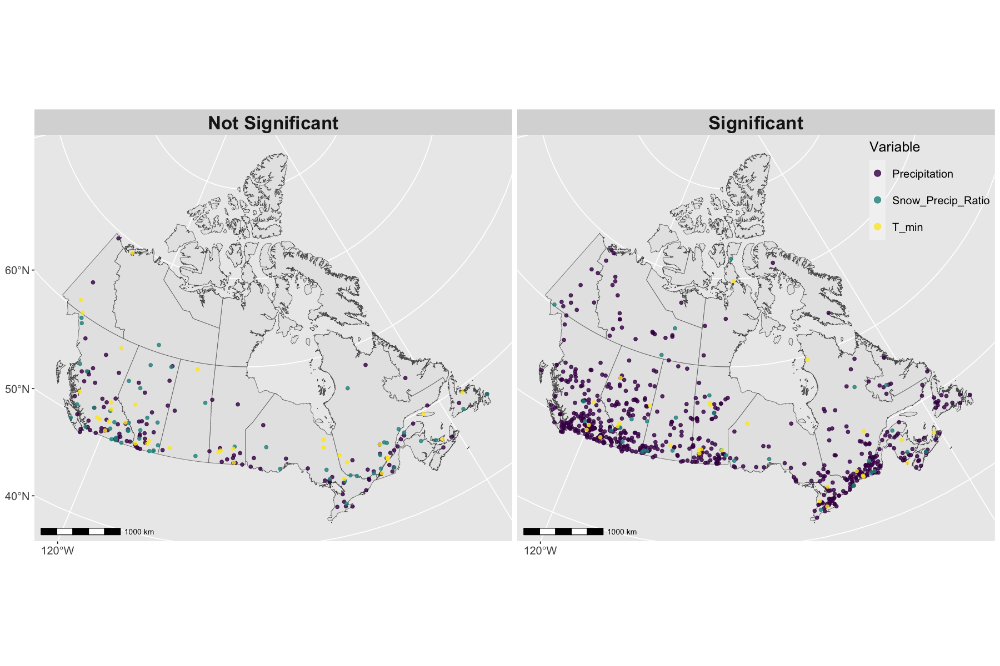

In [283]:
plot_map(provinces, importances.linear)